# Load & update package
Use update with caution, sometimes packages may implement breaking changes. If unsure, only 
use `Pkg.resolve()`

In [2]:
using Damysos, CairoMakie, Accessors, DataFrames, CSV

In [3]:
pwd()

"/misc/rz_cloud/richter/how09898/.julia/dev/Damysos/jupyter"

In [4]:
using Pkg
Pkg.update()

    Updating registry at `~/.julia/registries/General.toml`
  No Changes to `/misc/rz_cloud/richter/how09898/.julia/dev/Damysos/Project.toml`
  No Changes to `/misc/rz_cloud/richter/how09898/.julia/dev/Damysos/Manifest.toml`


# Load Fermi-sea data

In [4]:
function load_hdf5_files(path::String)
	allfiles = String[]
	for (root, dirs, files) in walkdir(path)
		for file in files
			file[end-4:end] == ".hdf5" && push!(allfiles,joinpath(root, file))
		end
	end
	@info "$(length(allfiles)) files found."
	return allfiles
end

load_hdf5_files (generic function with 1 method)

In [5]:
dirac_kymaxpath = "/home/how09898/phd/data/dirac/zeta-M-sweep1/kymax-rough/"
dirac_kymaxfiles = load_hdf5_files(dirac_kymaxpath)
dirac_kymaxsims = Damysos.loadlast_testsim.(dirac_kymaxfiles)
dirac_kymaxvels = [s.observables[2] for s in dirac_kymaxsims]
quad_kymaxpath = "/home/how09898/phd/data/quadratic/zeta-M-sweep1/kymax-rough/"
quad_kymaxfiles = load_hdf5_files(quad_kymaxpath)
quad_kymaxsims = Damysos.loadlast_testsim.(quad_kymaxfiles)
quad_kymaxvels = [s.observables[2] for s in quad_kymaxsims]

┌ Info: 9 files found.
└ @ Main /home/how09898/.julia/dev/Damysos/jupyter/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_W5sdnNjb2RlLXJlbW90ZQ==.jl:8
┌ Info: 9 files found.
└ @ Main /home/how09898/.julia/dev/Damysos/jupyter/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_W5sdnNjb2RlLXJlbW90ZQ==.jl:8


9-element Vector{Velocity{Float64}}:
 Velocity{Float64}([-6.1359769803543166e-15, 6.177517437320618e-7, 1.0891432007812808e-6, 1.3455254126047145e-6, 1.3806857459149517e-6, 1.246171338614108e-6, 1.0258732885559082e-6, 8.020458027461199e-7, 6.274616650145575e-7, 5.140838912759235e-7  …  -0.012537548140208783, -0.011997121135274052, -0.011444768713155192, -0.01088151035686842, -0.010308370172456392, -0.009726375198152403, -0.009136553729155217, -0.008539933661276528, -0.007937540855718206, -0.007330397527540876], [-6.1359769803543166e-15, -1.589361340983496e-16, 5.362140393023008e-15, 8.337633264175717e-16, -6.0135179917867355e-15, -5.211020790109823e-18, -6.208931271415854e-15, 5.5054434647510276e-15, -5.380378965788392e-15, -6.448638227760906e-15  …  -2.319894359547357e-5, -2.3209997399528722e-5, -2.3223636689740454e-5, -2.3239730265406152e-5, -2.32581472254178e-5, -2.327875735975036e-5, -2.330143126184525e-5, -2.3326040649033398e-5, -2.3352458530416096e-5, -2.3380559400993765e-5], [0.

In [6]:
diracpath = "/home/how09898/phd/data/dirac/zeta-M-sweep1/dt_1e-4_dkx_1e-2_dky_1e-2_kxmax_1e-2"
diracfiles = load_hdf5_files(diracpath)
diracsims = Damysos.loadlast_testsim.(diracfiles)
quadpath = "/home/how09898/phd/data/quadratic/zeta-M-sweep1/kxmax1_good"
quadfiles = load_hdf5_files(quadpath)
quadsims = Damysos.loadlast_testsim.(quadfiles)

┌ Info: 9 files found.
└ @ Main /home/how09898/.julia/dev/Damysos/jupyter/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_W5sdnNjb2RlLXJlbW90ZQ==.jl:8
┌ Info: 9 files found.
└ @ Main /home/how09898/.julia/dev/Damysos/jupyter/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_W5sdnNjb2RlLXJlbW90ZQ==.jl:8


9-element Vector{Simulation{Float64}}:
 Simulation{Float64}(TwoBandDephasingLiouvillian{Float64}(QuadraticToy{Float64}(0.6283185307179587, 0.10000000000000005), Inf, Inf), GaussianAPulse{Float64}(1.5, 6.283185307179586, 15.749609945722415, 0.0, 0.0), NumericalParams2d{Float64}(0.007519884823892999, 1.0, 33.689084011040634, 1.0, 0.00625, -7.5, 1.0e-10, 1.0e-12), Damysos.Observable{Float64}[Occupation{Float64}([0.0, 6.002767714383796e-16, 2.259251656933519e-15, 4.7587440689320036e-15, 7.875861719506308e-15, 1.1386398912448505e-14, 1.5068584354545353e-14, 1.8707174491085935e-14, 2.209788509833014e-14, 2.505215038858135e-14  …  0.04676325745331787, 0.046763257453416994, 0.04676325745353884, 0.04676325745368186, 0.04676325745384445, 0.046763257454024945, 0.04676325745422163, 0.04676325745443278, 0.04676325745465663, 0.04676325745489142]), Velocity{Float64}([5.197241293064222e-16, 6.129447336077397e-9, 1.1888825192502846e-8, 1.724863697280031e-8, 2.2179531689870653e-8, 2.665242740047234e-8, 

In [7]:
diracvels = [s.observables[2] for s in diracsims]
quadvels = [s.observables[2] for s in quadsims]

9-element Vector{Velocity{Float64}}:
 Velocity{Float64}([5.197241293064222e-16, 6.129447336077397e-9, 1.1888825192502846e-8, 1.724863697280031e-8, 2.2179531689870653e-8, 2.665242740047234e-8, 3.063855867335858e-8, 3.4109470092725725e-8, 3.703694869407643e-8, 3.939295752615183e-8  …  -1.1284518415635624e-5, -1.115681424944365e-5, -1.1013987167774636e-5, -1.0856433994813444e-5, -1.0684569919283665e-5, -1.0498827626075225e-5, -1.0299656396428667e-5, -1.0087521203095448e-5, -9.862901782716986e-6, -9.62629169564371e-6], [5.197241293064222e-16, 8.662068821773704e-16, 1.2126896350483186e-15, 1.0394482586128444e-15, 6.063448175241593e-16, 9.528275703951073e-16, 5.197241293064222e-16, 1.2993103232660555e-15, 5.197241293064222e-16, 6.063448175241593e-16  …  4.084028857303051e-8, 4.031833846527827e-8, 3.967523286712276e-8, 3.8917501159421144e-8, 3.8051632097927826e-8, 3.708405423701887e-8, 3.602113159865764e-8, 3.486914851377434e-8, 3.363430199964543e-8, 3.2322694137273104e-8], [0.0, 6.1294465180

## Spectra

### Dirac

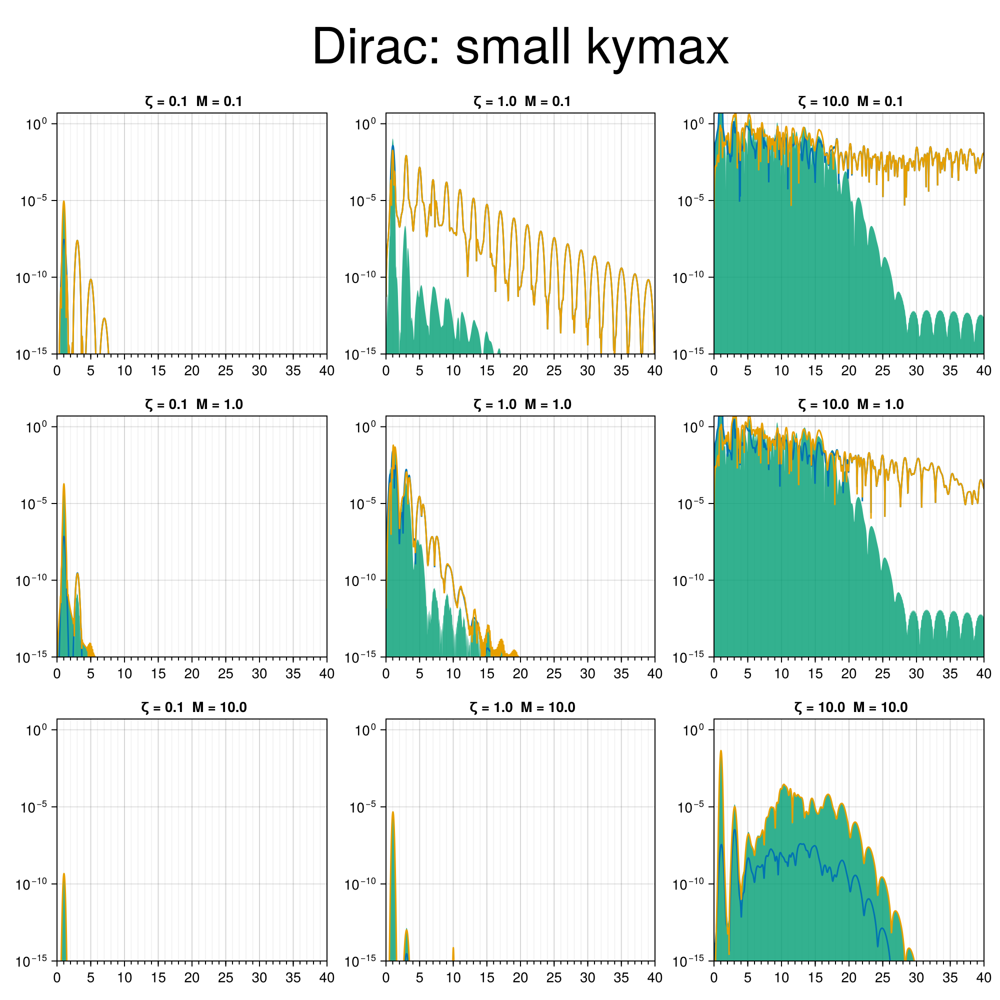

In [17]:
fig   = Figure(size=(1000,1000))
ii = CartesianIndices((1:3,1:3))
maxharm = 40
for i in 1:9
    ζ,M = match(r"zeta=([0-9.]+)_M=([0-9.]+)",diracfiles[i]).captures
    p = getparams(diracsims[i])
    v = diracvels[i]
    specdata = [Damysos.calculate_spectrum(data,p.dt) for data in [v.vx,v.vxintra,v.vxinter]]
    specdata = [(data[1][data[2] .> 1e-50],data[2][data[2] .> 1e-50]) for data in specdata]

    # norm = maximum(specdata[1][2])
    norm = 1.0

    ax  = Axis(fig[ii[i][1],ii[i][2]],
        title=" ζ = $ζ  M = $M",
        yscale=log10,
        xminorticksvisible=true,
        xminorgridvisible=true,
        xminorticks=0:1:maxharm,
        xticks=0:5:maxharm)
    band!(ax,specdata[1][1],fill(1e-50,length(specdata[1][1])),specdata[1][2] ./norm,color=Cycled(3))
    for data in specdata[2:3]
        lines!(ax,data[1],data[2] ./ norm)
    end
    xlims!(ax,(0,40))
    ylims!(ax,(1e-15,5))
end

fig[0,:] = Label(fig,"Dirac: small kymax",fontsize=50)
CairoMakie.save("zeta-m-plane-plots/allspectra-dirac-small-kymax.png",fig,px_per_unit=5)
fig

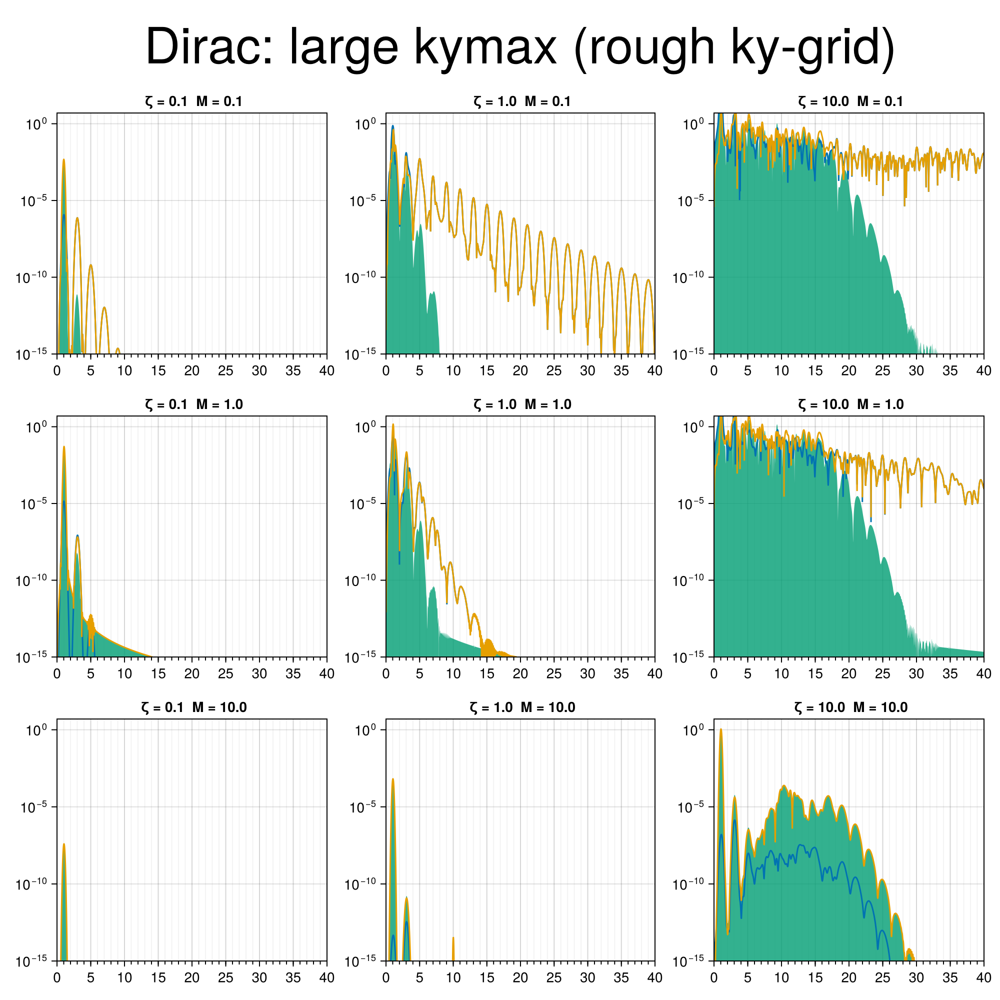

In [16]:
fig   = Figure(size=(1000,1000))
ii = CartesianIndices((1:3,1:3))
maxharm = 40
for i in 1:9
    ζ,M = match(r"zeta=([0-9.]+)_M=([0-9.]+)",dirac_kymaxfiles[i]).captures
    p = getparams(dirac_kymaxsims[i])
    v = dirac_kymaxvels[i]
    specdata = [Damysos.calculate_spectrum(data,p.dt) for data in [v.vx,v.vxintra,v.vxinter]]
    specdata = [(data[1][data[2] .> 1e-50],data[2][data[2] .> 1e-50]) for data in specdata]

    # norm = maximum(specdata[1][2])
    norm = 1.0

    ax  = Axis(fig[ii[i][1],ii[i][2]],
        title=" ζ = $ζ  M = $M",
        yscale=log10,
        xminorticksvisible=true,
        xminorgridvisible=true,
        xminorticks=0:1:maxharm,
        xticks=0:5:maxharm)
    band!(ax,specdata[1][1],fill(1e-50,length(specdata[1][1])),specdata[1][2] ./norm,color=Cycled(3))
    for data in specdata[2:3]
        lines!(ax,data[1],data[2] ./ norm)
    end
    xlims!(ax,(0,40))
    ylims!(ax,(1e-15,5))
end

fig[0,:] = Label(fig,"Dirac: large kymax (rough ky-grid)",fontsize=50)
CairoMakie.save("zeta-m-plane-plots/allspectra-dirac-large-kymax.png",fig,px_per_unit=5)
fig

### Quadratic

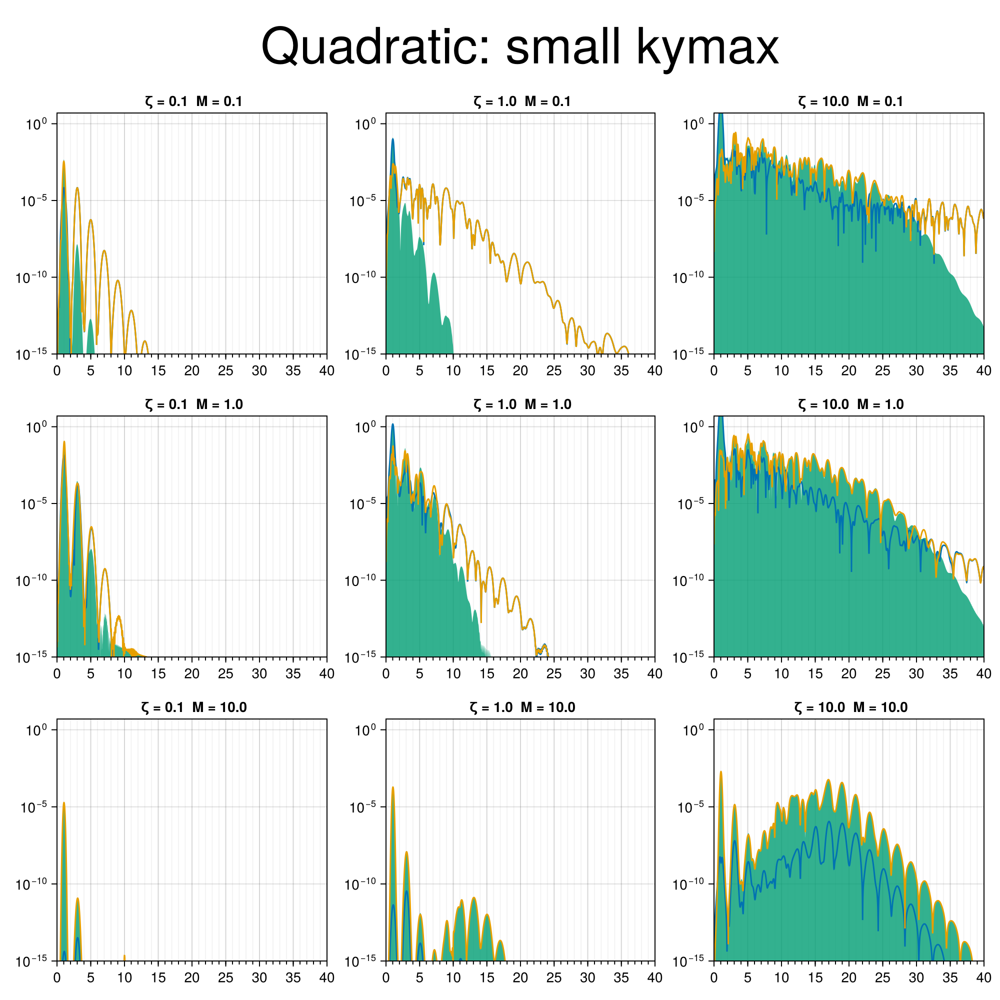

In [15]:
fig   = Figure(size=(1000,1000))
ii = CartesianIndices((1:3,1:3))
for i in 1:9
    ζ,M = match(r"zeta=([0-9.]+)_M=([0-9.]+)",quadfiles[i]).captures
    p = getparams(quadsims[i])
    v = quadvels[i]
    specdata = [Damysos.calculate_spectrum(data,p.dt) for data in [v.vx,v.vxintra,v.vxinter]]
    specdata = [(data[1][data[2] .> 1e-50],data[2][data[2] .> 1e-50]) for data in specdata]

    # norm = maximum(specdata[1][2])
    norm = 1.0

    ax  = Axis(fig[ii[i][1],ii[i][2]],
        title=" ζ = $ζ  M = $M",
        yscale=log10,
        xminorticksvisible=true,
        xminorgridvisible=true,
        xminorticks=0:1:maxharm,
        xticks=0:5:maxharm)
    band!(ax,specdata[1][1],fill(1e-50,length(specdata[1][1])),specdata[1][2] ./norm,color=Cycled(3))
    for data in specdata[2:3]
        lines!(ax,data[1],data[2] ./ norm)
    end
    xlims!(ax,(0,40))
    ylims!(ax,(1e-15,5))
end

fig[0,:] = Label(fig,"Quadratic: small kymax",fontsize=50)
CairoMakie.save("zeta-m-plane-plots/allspectra-quadratic-small-kymax.png",fig,px_per_unit=5)
fig

### Kymax for Dirac

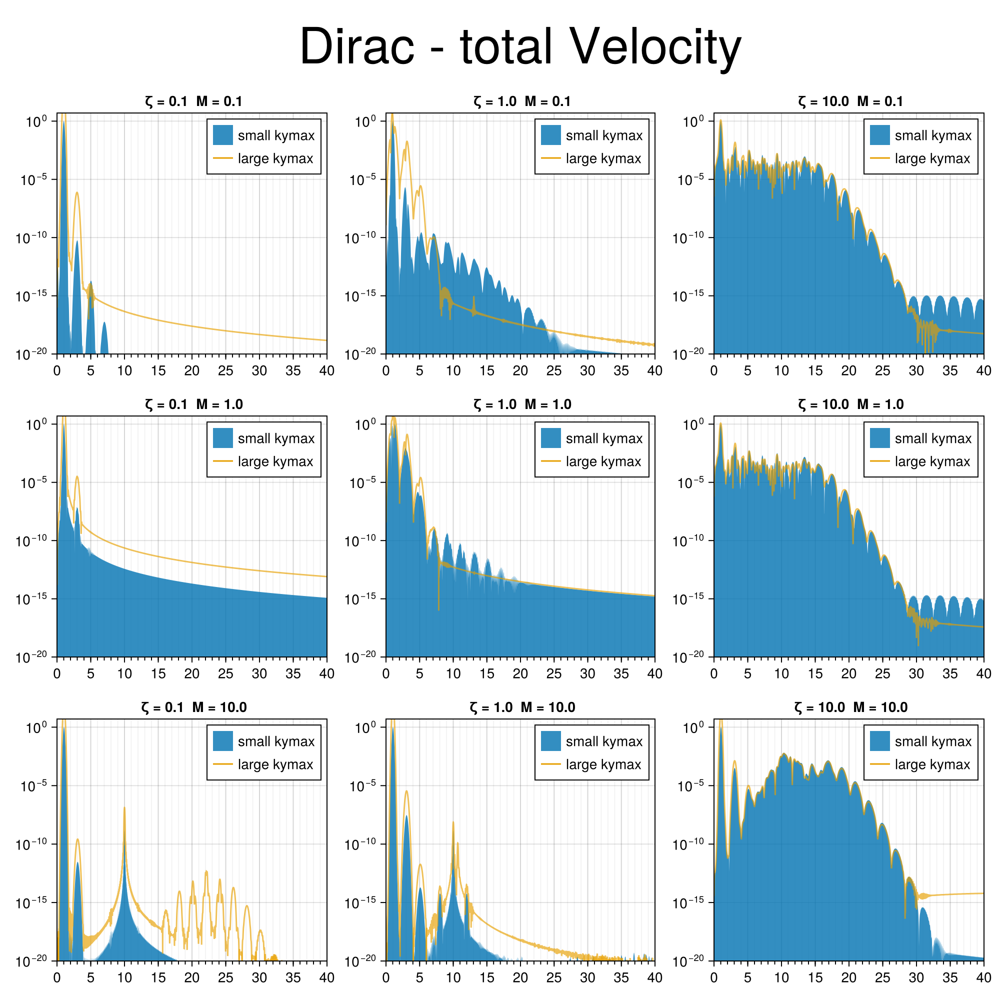

In [12]:
fig   = Figure(size=(1000,1000))
ii = CartesianIndices((1:3,1:3))
maxharm = 40
for i in 1:9
    ζ,M = match(r"zeta=([0-9.]+)_M=([0-9.]+)",diracfiles[i]).captures
    p = getparams(diracsims[i])
    v = diracvels[i]
    v2 = dirac_kymaxvels[i]
    specdata = [Damysos.calculate_spectrum(data,p.dt) for data in [v.vx,v.vxintra,v.vxinter]]
    specdata = [(data[1][data[2] .> 1e-50],data[2][data[2] .> 1e-50]) for data in specdata]

    specdata2 = [Damysos.calculate_spectrum(data,p.dt) for data in [v2.vx,v2.vxintra,v2.vxinter]]
    specdata2 = [(data[1][data[2] .> 1e-50],data[2][data[2] .> 1e-50]) for data in specdata2]

    norm = maximum(specdata[1][2])
    # norm2 = maximum(specdata2[1][2])
    norm2 = norm

    ax  = Axis(fig[ii[i][1],ii[i][2]],
        title=" ζ = $ζ  M = $M",
        yscale=log10,
        xminorticksvisible=true,
        xminorgridvisible=true,
        xminorticks=0:1:maxharm,
        xticks=0:5:maxharm)
    band!(ax,specdata[1][1],fill(1e-50,length(specdata[1][1])),specdata[1][2] ./norm,
        color=Cycled(1),
        alpha=1.0,
        label="small kymax")
    lines!(ax,specdata2[1][1],specdata2[1][2] ./norm2,
        color=Cycled(2),
        alpha=0.66,
        label="large kymax")
    xlims!(ax,(0,40))
    ylims!(ax,(1e-20,5))
    axislegend(ax)
end


fig[0,:] = Label(fig,"Dirac - total Velocity",fontsize=50)
CairoMakie.save("zeta-m-plane-plots/spectra-dirac-kymax-total.png",fig,px_per_unit=5)
fig

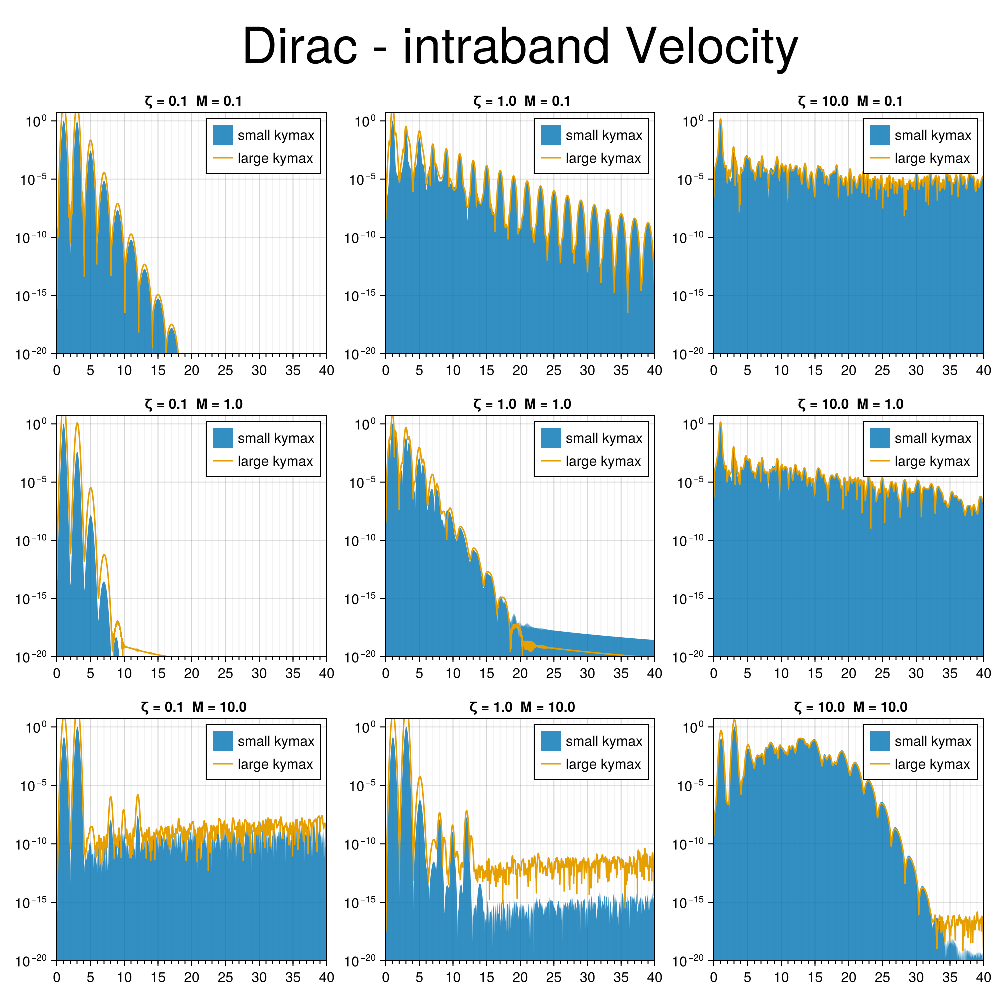

In [14]:
fig   = Figure(size=(1000,1000))
ii = CartesianIndices((1:3,1:3))
maxharm = 40
for i in 1:9
    ζ,M = match(r"zeta=([0-9.]+)_M=([0-9.]+)",diracfiles[i]).captures
    p = getparams(diracsims[i])
    v = diracvels[i]
    v2 = dirac_kymaxvels[i]
    specdata = [Damysos.calculate_spectrum(data,p.dt) for data in [v.vx,v.vxintra,v.vxinter]]
    specdata = [(data[1][data[2] .> 1e-50],data[2][data[2] .> 1e-50]) for data in specdata]

    specdata2 = [Damysos.calculate_spectrum(data,p.dt) for data in [v2.vx,v2.vxintra,v2.vxinter]]
    specdata2 = [(data[1][data[2] .> 1e-50],data[2][data[2] .> 1e-50]) for data in specdata2]

    norm = maximum(specdata[2][2])
    # norm2 = maximum(specdata2[2][2])
    norm2 = norm

    ax  = Axis(fig[ii[i][1],ii[i][2]],
        title=" ζ = $ζ  M = $M",
        yscale=log10,
        xminorticksvisible=true,
        xminorgridvisible=true,
        xminorticks=0:1:maxharm,
        xticks=0:5:maxharm)
    band!(ax,specdata[2][1],fill(1e-50,length(specdata[2][1])),specdata[2][2] ./norm,
        color=Cycled(1),
        alpha=1.0,
        label="small kymax")
    lines!(ax,specdata2[2][1],specdata2[2][2] ./ norm2,color=Cycled(2), label="large kymax")
    xlims!(ax,(0,40))
    ylims!(ax,(1e-20,5))
    axislegend(ax)
end


fig[0,:] = Label(fig,"Dirac - intraband Velocity",fontsize=50)
CairoMakie.save("zeta-m-plane-plots/spectra-dirac-kymax-intra.png",fig,px_per_unit=5)
fig

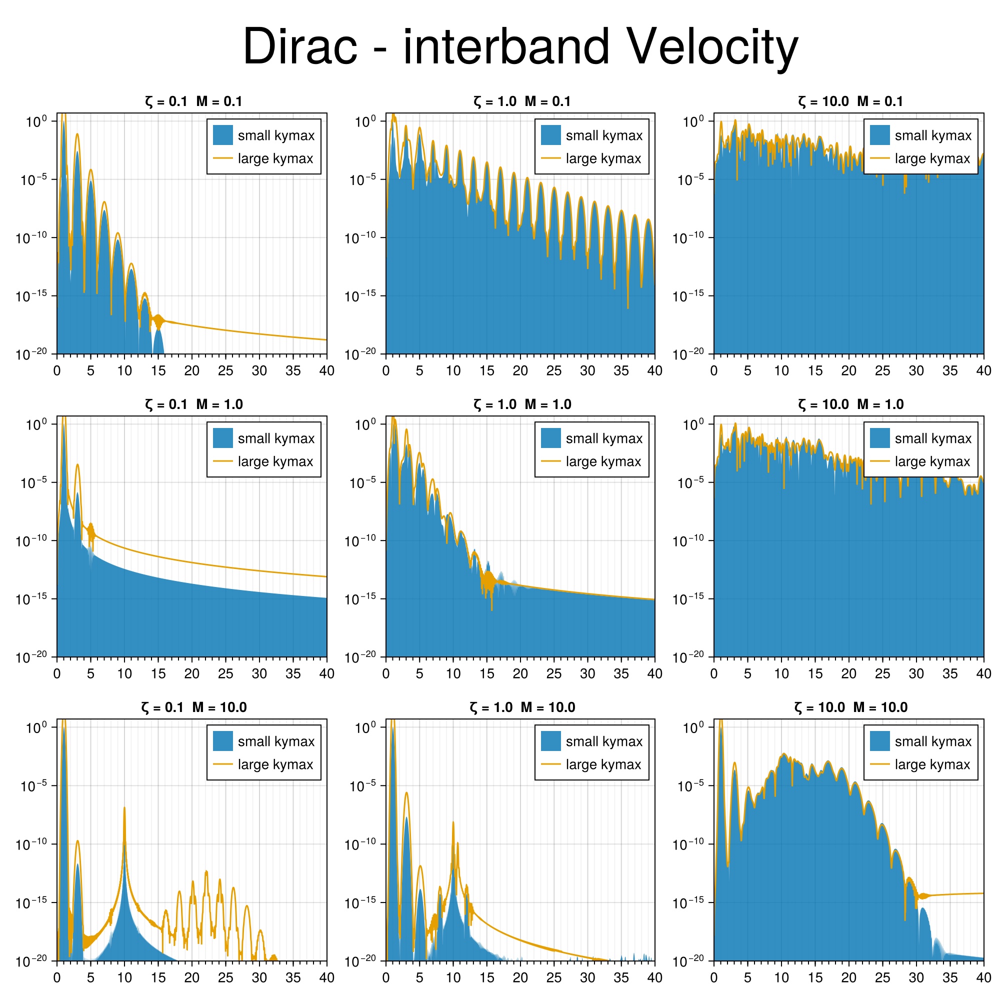

In [15]:
fig   = Figure(size=(1000,1000))
ii = CartesianIndices((1:3,1:3))
maxharm = 40
for i in 1:9
    ζ,M = match(r"zeta=([0-9.]+)_M=([0-9.]+)",diracfiles[i]).captures
    p = getparams(diracsims[i])
    v = diracvels[i]
    v2 = dirac_kymaxvels[i]
    specdata = [Damysos.calculate_spectrum(data,p.dt) for data in [v.vx,v.vxintra,v.vxinter]]
    specdata = [(data[1][data[2] .> 1e-50],data[2][data[2] .> 1e-50]) for data in specdata]

    specdata2 = [Damysos.calculate_spectrum(data,p.dt) for data in [v2.vx,v2.vxintra,v2.vxinter]]
    specdata2 = [(data[1][data[2] .> 1e-50],data[2][data[2] .> 1e-50]) for data in specdata2]

    norm = maximum(specdata[3][2])
    # norm2 = maximum(specdata2[1][2])
    norm2 = norm

    ax  = Axis(fig[ii[i][1],ii[i][2]],
        title=" ζ = $ζ  M = $M",
        yscale=log10,
        xminorticksvisible=true,
        xminorgridvisible=true,
        xminorticks=0:1:maxharm,
        xticks=0:5:maxharm)
    band!(ax,specdata[3][1],fill(1e-50,length(specdata[3][1])),specdata[3][2] ./norm,
        color=Cycled(1),
        alpha=1.0,
        label="small kymax")
    lines!(ax,specdata2[3][1],specdata2[3][2] ./ norm2,color=Cycled(2), label="large kymax")
    xlims!(ax,(0,40))
    ylims!(ax,(1e-20,5))
    axislegend(ax)
end


fig[0,:] = Label(fig,"Dirac - interband Velocity",fontsize=50)
CairoMakie.save("zeta-m-plane-plots/spectra-dirac-kymax-inter.png",fig,px_per_unit=5)
fig

In [20]:
fig

### Interlude: FFT manually

In [62]:
using FFTW
using DSP

function pad_n_window(x::AbstractVector{<:Number};window=hanning,pad_factor=4)
    n = length(x)
    n_padded = pad_factor * n
    res = zeros(eltype(x),n_padded)
    res[1:n] .= x .* window(n)
    return res
end

pad_n_window (generic function with 1 method)

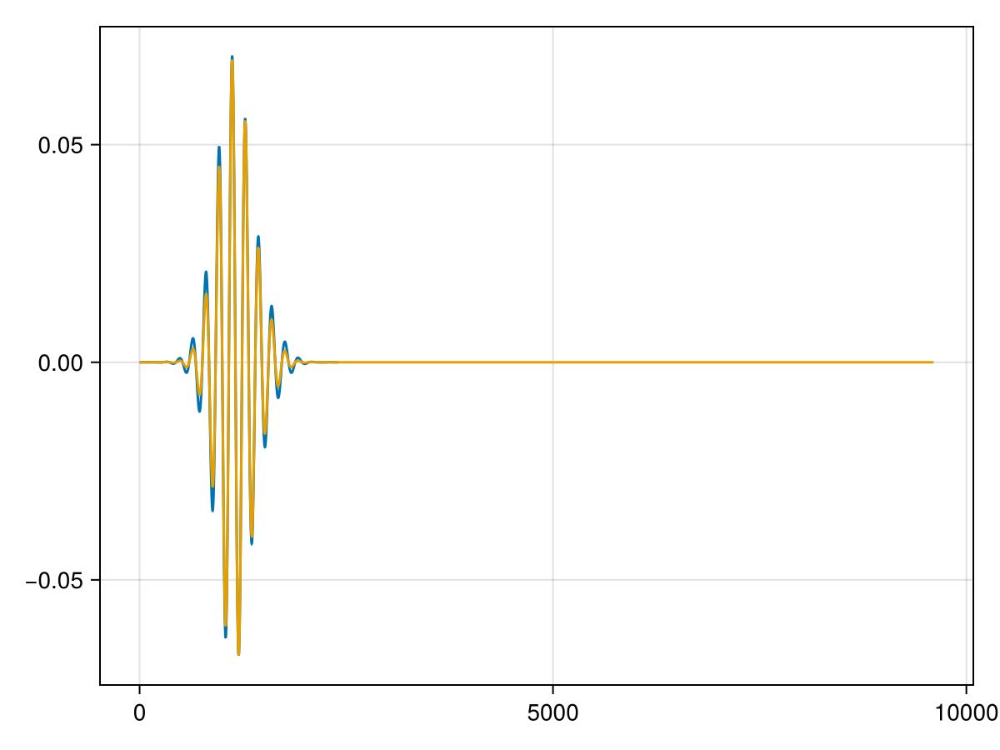

In [63]:
vx=quadvels[1].vx
fig,ax,pl=lines(vx)
lines!(ax,pad_n_window(vx))
fig

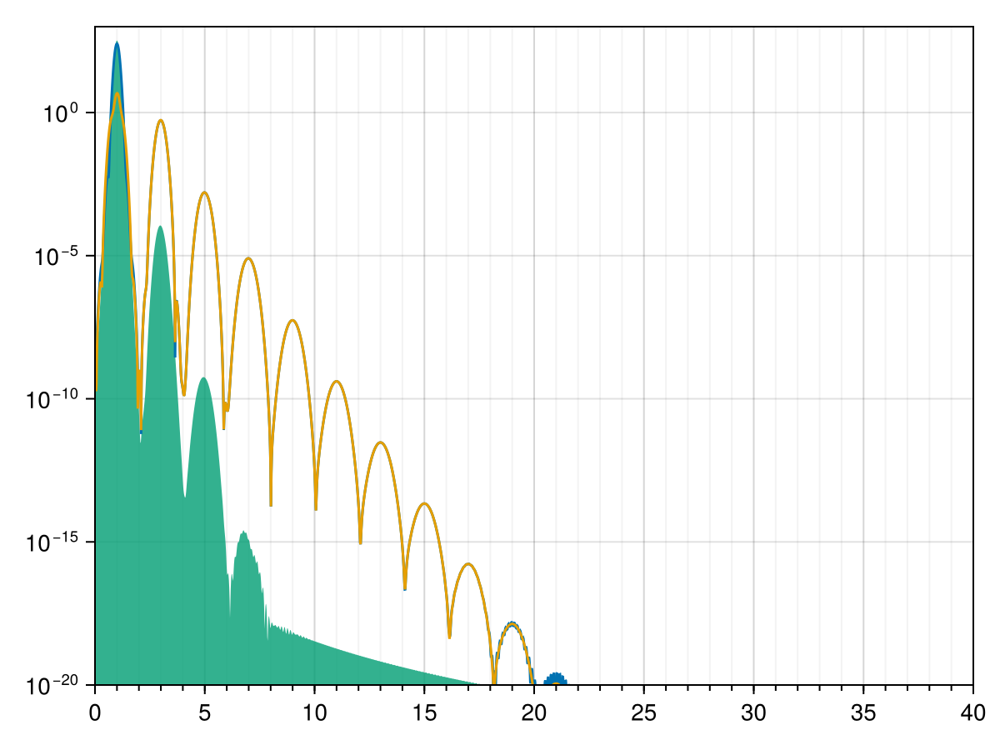

In [64]:
using FFTW
maxharm=200
vx = pad_n_window(quadvels[1].vx,window=hanning,pad_factor=4)
vxer = pad_n_window(quadvels[1].vxinter,window=hanning,pad_factor=4)
vxra = pad_n_window(quadvels[1].vxintra,window=hanning,pad_factor=4)
vx_ft = abs2.(rfft(vx))
vxer_ft = abs2.(rfft(vxer))
vxra_ft = abs2.(rfft(vxra))
dt = getparams(quadsims[1]).dt
vx_f  = rfftfreq(length(vx),1/dt)
fig = Figure()
ax  = Axis(fig[1,1],
        yscale=log10,
        xminorticksvisible=true,
        xminorgridvisible=true,
        xminorticks=0:1:maxharm,
        xticks=0:5:maxharm)
band!(ax,vx_f,fill(1e-50,length(vx_ft)),vx_ft,color=Cycled(3))
lines!(ax,vx_f,vxer_ft,label="inter")
lines!(ax,vx_f,vxra_ft,label="intra")
xlims!(ax,0,40)
ylims!(1e-20,1000)
fig

## Explored band-regime

In [65]:
getparams(quadsims[1]).bz

(-30.430467254020336, 30.430467254020336, -1.0, 1.0)

In [66]:
for s in diracsims
    @show Damysos.maximum_vecpotx(s.drivingfield)
end
for s in quadsims
    @show Damysos.maximum_vecpotx(s.drivingfield)
end

Damysos.maximum_vecpotx(s.drivingfield) = 0.31415926535897937
Damysos.maximum_vecpotx(s.drivingfield) = 0.31415926535897937
Damysos.maximum_vecpotx(s.drivingfield) = 0.31415926535897937
Damysos.maximum_vecpotx(s.drivingfield) = 3.141592653589793
Damysos.maximum_vecpotx(s.drivingfield) = 3.141592653589793
Damysos.maximum_vecpotx(s.drivingfield) = 3.141592653589793
Damysos.maximum_vecpotx(s.drivingfield) = 31.41592653589794
Damysos.maximum_vecpotx(s.drivingfield) = 31.41592653589794
Damysos.maximum_vecpotx(s.drivingfield) = 31.41592653589794
Damysos.maximum_vecpotx(s.drivingfield) = 2.506628274631
Damysos.maximum_vecpotx(s.drivingfield) = 2.506628274631
Damysos.maximum_vecpotx(s.drivingfield) = 2.506628274631
Damysos.maximum_vecpotx(s.drivingfield) = 2.5066282746310007
Damysos.maximum_vecpotx(s.drivingfield) = 2.5066282746310007
Damysos.maximum_vecpotx(s.drivingfield) = 2.5066282746310007
Damysos.maximum_vecpotx(s.drivingfield) = 2.506628274631
Damysos.maximum_vecpotx(s.drivingfield) = 2

### Dirac

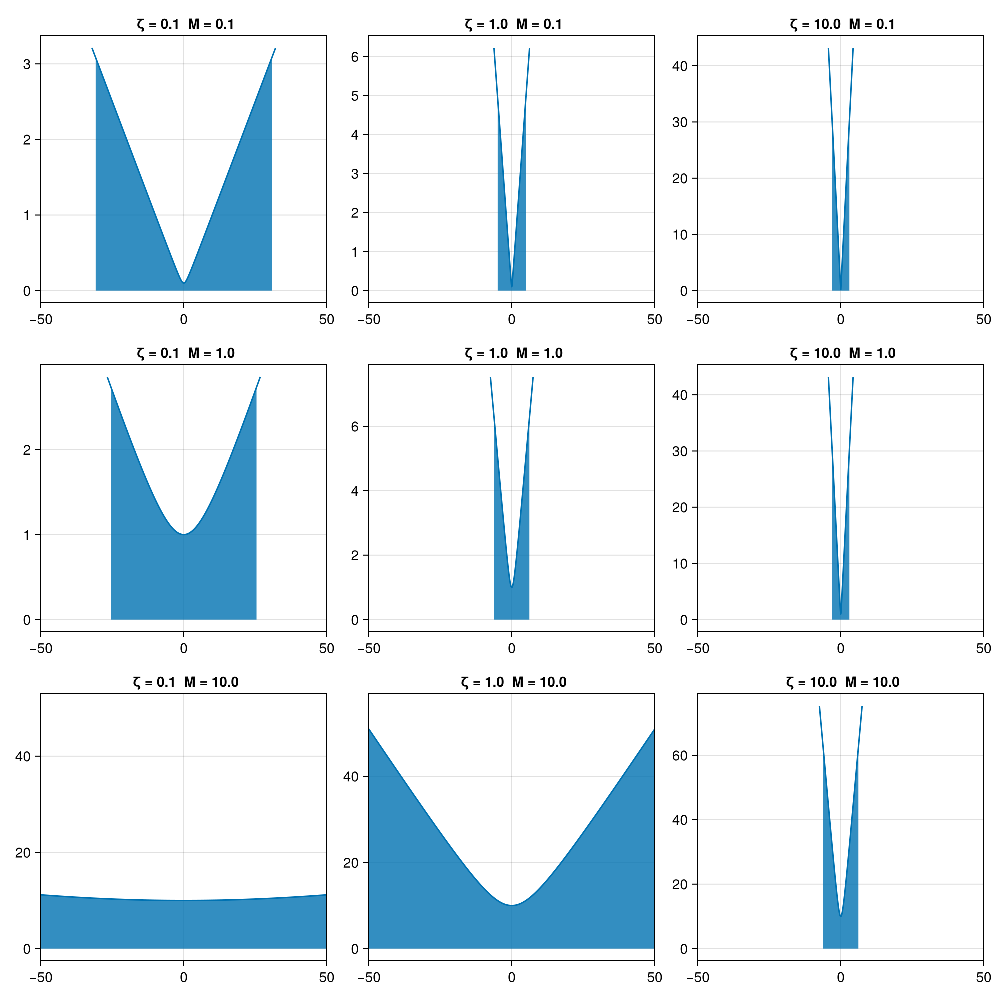

In [68]:
fig   = Figure(size=(1000,1000))
ii = CartesianIndices((1:3,1:3))
for i in 1:9
    ζ,M = match(r"zeta=([0-9.]+)_M=([0-9.]+)",diracfiles[i]).captures
    p = getparams(diracsims[i])
    en = getΔϵ(diracsims[i])
    a = Damysos.maximum_vecpotx(diracsims[i].drivingfield)
    eq(k) = en(a*k,0)  / p.ω

    ax  = Axis(fig[ii[i][1],ii[i][2]],
        title=" ζ = $ζ  M = $M")
    ks = getkxsamples(diracsims[i]) ./ a
    # vlines!(ax,[-k[1] / a,k[1] / a],color=:black)
    lines!(ax,ks,eq.(ks))
    inds = ks .> p.bz[1]/a .&& ks .< p.bz[2]/a
    band!(ax,ks[inds],zeros(length(ks[inds])),eq.(ks[inds]))
    xlims!(ax,-50,50)
end

fig

### Quadratic

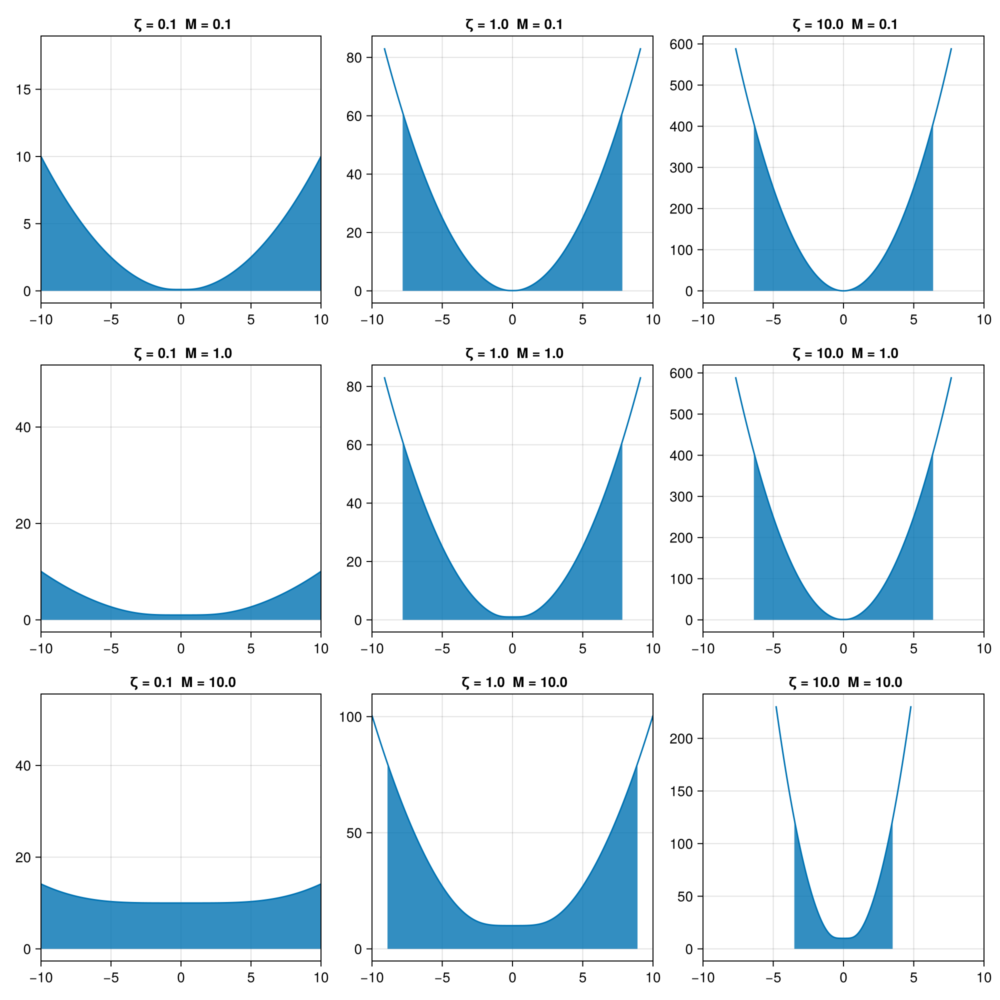

In [72]:
using CairoMakie

fig   = Figure(size=(1000,1000))
ii = CartesianIndices((1:3,1:3))
for i in 1:9
    ζ,M = match(r"zeta=([0-9.]+)_M=([0-9.]+)",quadfiles[i]).captures
    p = getparams(quadsims[i])
    en = getΔϵ(quadsims[i])
    a = Damysos.maximum_vecpotx(quadsims[i].drivingfield)
    eq(k) = en(a*k,0) / p.ω

    ax  = Axis(fig[ii[i][1],ii[i][2]],
        title=" ζ = $ζ  M = $M")
    ks = getkxsamples(quadsims[i]) ./ a
    # vlines!(ax,[- k[1] / a, k[1] / a],color=:black)
    lines!(ax,ks,eq.(ks))
    inds = ks .> p.bz[1]/a .&& ks .< p.bz[2]/a
    band!(ax,ks[inds],zeros(length(ks[inds])),eq.(ks[inds]))
    xlims!(ax,-10,10)
end

fig

# Single mode(s)

In [79]:
function singlemodesim(s::Simulation,kx::Real=0.0,ky::Real=0.0,path="singlemodedata")
    p = s.numericalparams
    newp = NumericalParamsSingleMode(kx, ky, p.dt, p.t0)
    
    return Simulation(
        s.liouvillian,
        s.drivingfield,
        newp,
        [Velocity(newp),Occupation(newp)],
        s.unitscaling,
        s.id,
        path,
        path)
end

function makesims(parent::Simulation,path="singlemodedata")
    return [singlemodesim(parent,k/2,0.0,path) for k in getparams(parent).bz[1:2]]
end

makesims (generic function with 2 methods)

## Compare spectra at k=0 and at edges of BZ

┌ Info: ## Simulation{Float64}(0d)TwoBandDephasingLiouvillian(QuadraticToy)_GaussianAPulse (id: #3_kxmax=12.031815718228799)
│ 
│ Starting on **pc1042350191** at **2024-09-17T18:51:55.464**:
│ 
│ * threads: 1
│ * processes: 1
│ * Solver: SingleMode()
│ * plotpath: singlemodedata
│ * datapath: singlemodedata
│ 
│ | Parameter | Value (SI units) | Value (scaled) |
│ |-----------|------------------|----------------|
│ | M | 10.0 |   |
│ | ζ | 10.0Δ  = 207.0 meV  | 62.831853071795855 |
│ | m* | 9.71e-33 kg  | 0.1 |
│ | t2 | Inf fs  |   |
│ | σ | 300.0 fs  | 1.5 |
│ | ω | 0.0314 fs^-1  | 6.28 |
│ | ν | 5.0 THz  | 1.0 |
│ | eE | 0.0882 MV cm^-1  | 15.7 |
│ | φ | 0.0  | 0.0 |
│ | ħω | 0.0207 eV  | 6.28 |
│ | kx | 0.0 Å^-1  | 0.0 |
│ | ky | 0.0 Å^-1  | 0.0 |
│ | t0 | -1500.0 fs  |   |
│ | dt | 0.156 fs  | 0.000781 |
│ | nt | 19200.0  | 19200.0 |
│ | rtol | 1.0e-10  |   |
│ | atol | 1.0e-12  |   |
│ 
└ @ Damysos /home/how09898/.julia/dev/Damysos/src/Core.jl:133
┌ Info: ## Simulation{Float64}(0d)

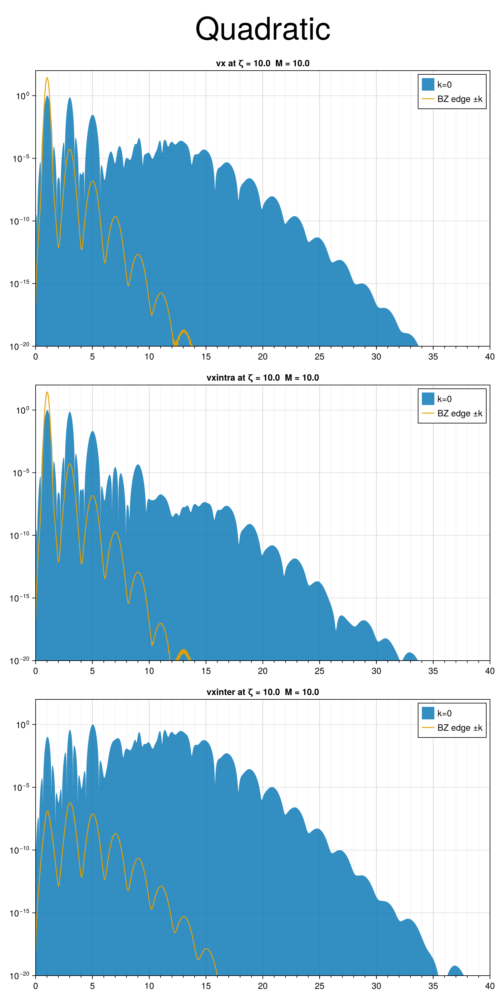

In [169]:
# sim = diracsims[9]
sim = quadsims[9]
p = getparams(sim)
capt = match(r"zeta=([0-9.]*)_M=([0-9.]+)",sim.datapath).captures
ζ = capt[1]
M = capt[2]
sample_k = p.bz[1]

allsims=[singlemodesim(sim,k,0) for k in (0.0,sample_k,-sample_k)]
allfns=[define_functions(s,SingleMode()) for s in allsims]

allobs=[]
for (s,fs) in zip(allsims,allfns) 
    run!(s,fs,SingleMode();savedata=false,saveplots=false)
    push!(allobs,s.observables[1])
end

fig   = Figure(size=(800,1600))
obs   = [allobs[1],allobs[2] + allobs[3]]

for (i,s) in zip(1:3,(:vx,:vxintra,:vxinter))
    v1 = getproperty(obs[1],s)
    v2 = getproperty(obs[2],s)
    specdata = [Damysos.calculate_spectrum(data,p.dt) for data in [v1,v2]]
    specdata = [(data[1][data[2] .> 1e-50],data[2][data[2] .> 1e-50]) for data in specdata]

    norm = maximum(specdata[1][2])

    ax  = Axis(fig[i,1],
        title="$s at ζ = $ζ  M = $M",
        yscale=log10,
        xminorticksvisible=true,
        xminorgridvisible=true,
        xminorticks=0:1:maxharm,
        xticks=0:5:maxharm)
    band!(ax,specdata[1][1],fill(1e-50,length(specdata[1][1])),specdata[1][2] ./norm;
        label="k=0")
    lines!(ax,specdata[2][1],specdata[2][2] ./ norm,color=Cycled(2),label="BZ edge ±k")
    xlims!(ax,(0,40))
    ylims!(ax,(1e-20,100))
    axislegend(ax)
end
fig[0,:] = Label(fig,"Quadratic",fontsize=50,tellwidth=false)
# fig[0,:] = Label(fig,"Dirac",fontsize=50,tellwidth=false)
lab = match(r"zeta=([0-9.]*)_M=([0-9.]+)",sim.datapath).match
# CairoMakie.save("kmode-comparison/dirac/contrib_"*lab*".png",fig,px_per_unit=5)
CairoMakie.save("kmode-comparison/quadratic/contrib_"*lab*".png",fig,px_per_unit=5)
fig


## Compare suppression at k=0 and edges of BZ

┌ Info: ## Simulation{Float64}(0d)TwoBandDephasingLiouvillian(QuadraticToy)_GaussianAPulse (id: #3_kxmax=12.031815718228799)
│ 
│ Starting on **pc1042350191** at **2024-09-17T18:56:33.296**:
│ 
│ * threads: 1
│ * processes: 1
│ * Solver: SingleMode()
│ * plotpath: singlemodedata
│ * datapath: singlemodedata
│ 
│ | Parameter | Value (SI units) | Value (scaled) |
│ |-----------|------------------|----------------|
│ | M | 10.0 |   |
│ | ζ | 10.0Δ  = 207.0 meV  | 62.831853071795855 |
│ | m* | 9.71e-33 kg  | 0.1 |
│ | t2 | Inf fs  |   |
│ | σ | 300.0 fs  | 1.5 |
│ | ω | 0.0314 fs^-1  | 6.28 |
│ | ν | 5.0 THz  | 1.0 |
│ | eE | 0.0882 MV cm^-1  | 15.7 |
│ | φ | 0.0  | 0.0 |
│ | ħω | 0.0207 eV  | 6.28 |
│ | kx | 0.0 Å^-1  | 0.0 |
│ | ky | 0.0 Å^-1  | 0.0 |
│ | t0 | -1500.0 fs  |   |
│ | dt | 0.156 fs  | 0.000781 |
│ | nt | 19200.0  | 19200.0 |
│ | rtol | 1.0e-10  |   |
│ | atol | 1.0e-12  |   |
│ 
└ @ Damysos /home/how09898/.julia/dev/Damysos/src/Core.jl:133
┌ Info: ## Simulation{Float64}(0d)

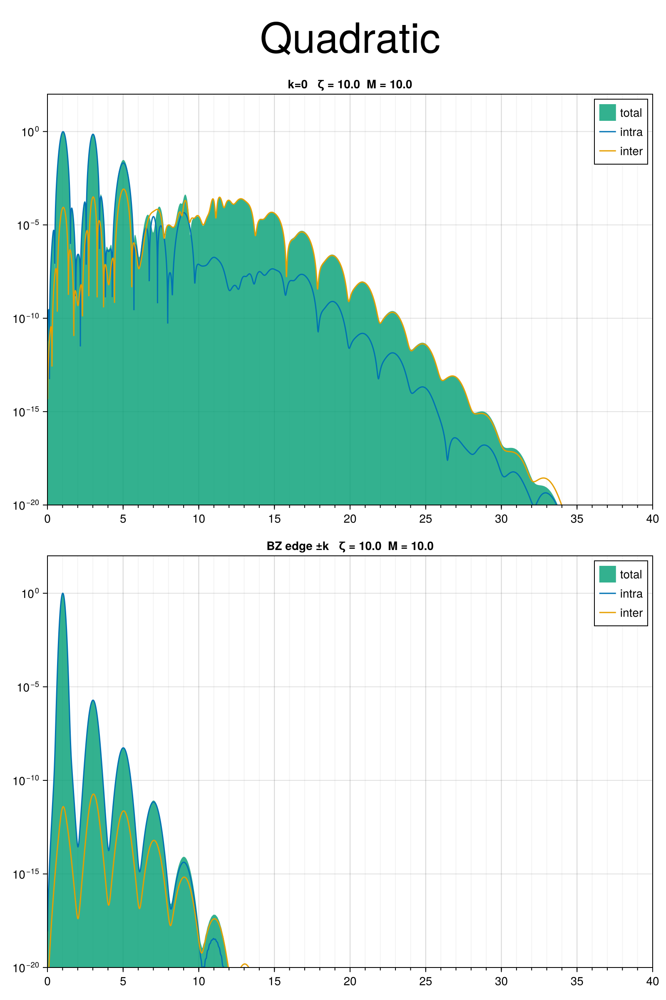

In [187]:

sim = quadsims[9]
p = getparams(sim)
capt = match(r"zeta=([0-9.]*)_M=([0-9.]+)",sim.datapath).captures
ζ = capt[1]
M = capt[2]
sample_k = p.bz[1]

allsims=[singlemodesim(sim,k,0) for k in (0.0,sample_k,-sample_k)]
allfns=[define_functions(s,SingleMode()) for s in allsims]

allobs=[]
for (s,fs) in zip(allsims,allfns) 
    run!(s,fs,SingleMode();savedata=false,saveplots=false)
    push!(allobs,s.observables[1])
end

fig   = Figure(size=(800,1200))
obs   = [allobs[1],allobs[2] + allobs[3]]

for (i,v,lab) in zip(1:2,obs,("k=0","BZ edge ±k"))
    specdata = [Damysos.calculate_spectrum(data,p.dt) for data in [v.vx,v.vxintra,v.vxinter]]
    specdata = [(data[1][data[2] .> 1e-50],data[2][data[2] .> 1e-50]) for data in specdata]
    
    norm = maximum(specdata[1][2])
    
    ax  = Axis(fig[i,1],
    title=lab*"   ζ = $ζ  M = $M",
    yscale=log10,
    xminorticksvisible=true,
    xminorgridvisible=true,
    xminorticks=0:1:maxharm,
    xticks=0:5:maxharm)
    band!(ax,specdata[1][1],fill(1e-50,length(specdata[1][1])),specdata[1][2] ./norm,color=Cycled(3),label="total")
    lines!(ax,specdata[2][1],specdata[2][2] ./ norm,label="intra")
    lines!(ax,specdata[3][1],specdata[3][2] ./ norm,label="inter")
    xlims!(ax,(0,40))
    ylims!(ax,(1e-20,100))
    axislegend(ax)
end
fig[0,:] = Label(fig,"Quadratic",fontsize=50,tellwidth=false)
# fig[0,:] = Label(fig,"Dirac",fontsize=50,tellwidth=false)
lab = match(r"zeta=([0-9.]*)_M=([0-9.]+)",sim.datapath).match
# CairoMakie.save("kmode-comparison/dirac/supp_"*lab*".png",fig,px_per_unit=5)
CairoMakie.save("kmode-comparison/quadratic/supp_"*lab*".png",fig,px_per_unit=5)
fig


## Modes at k=0

┌ Info: ## Simulation{Float64}(0d)TwoBandDephasingLiouvillian(GappedDirac)_GaussianAPulse (id: #14_kxmax=10.083872040087492)
│ 
│ Starting on **pc1042350191** at **2024-09-16T16:11:23.869**:
│ 
│ * threads: 1
│ * processes: 1
│ * Solver: SingleMode()
│ * plotpath: singlemodedata
│ * datapath: singlemodedata
│ 
│ | Parameter | Value (SI units) | Value (scaled) |
│ |-----------|------------------|----------------|
│ | ζ | 0.1 |   |
│ | γ | 0.5 |   |
│ | M | 0.1 |   |
│ | plz | 0.855 |   |
│ | m | 1.03 meV  | 0.3141592653589793 |
│ | vF | 497000.0 m s^-1  | 1.0 |
│ | t2 | Inf fs  |   |
│ | σ | 300.0 fs  | 1.5 |
│ | ω | 0.0314 fs^-1  | 6.28 |
│ | ν | 5.0 THz  | 1.0 |
│ | eE | 0.000653 MV cm^-1  | 1.97 |
│ | φ | 0.0  | 0.0 |
│ | ħω | 0.0207 eV  | 6.28 |
│ | kx | 0.0 Å^-1  | 0.0 |
│ | ky | 0.0 Å^-1  | 0.0 |
│ | t0 | -1500.0 fs  |   |
│ | dt | 0.565 fs  | 0.00282 |
│ | nt | 5310.0  | 5310.0 |
│ | rtol | 1.0e-10  |   |
│ | atol | 1.0e-12  |   |
│ 
└ @ Damysos /home/how09898/.julia/dev/Damysos/

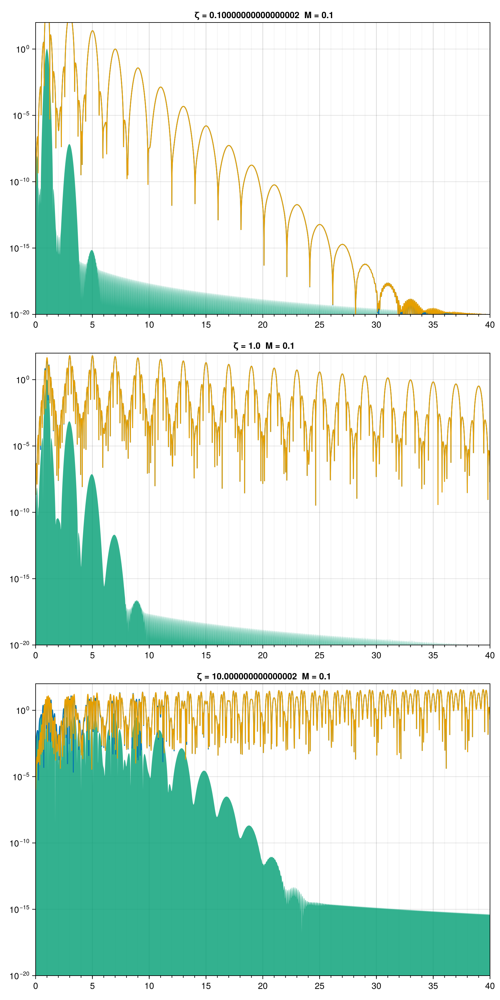

In [122]:
allsims=[singlemodesim(s) for s in (diracsims[1],diracsims[4],diracsims[7])]
allfns=[define_functions(s,SingleMode()) for s in allsims]
allobs=[]
for (s,fs) in zip(allsims,allfns)
    run!(s,fs,SingleMode();savedata=false,saveplots=false)
    push!(allobs,s.observables)
end

fig   = Figure(size=(800,1600))
for (i,dsim) in zip(1:3,(diracsims[1],diracsims[4],diracsims[7]))
    p = getparams(dsim)
    ζ = 2 * Damysos.maximum_vecpot(dsim.drivingfield) / p.ω
    M = 2 * dsim.liouvillian.hamiltonian.m / p.ω
    v = allobs[i][1]
    specdata = [Damysos.calculate_spectrum(data,p.dt) for data in [v.vx,v.vxintra,v.vxinter]]
    specdata = [(data[1][data[2] .> 1e-50],data[2][data[2] .> 1e-50]) for data in specdata]

    norm = maximum(specdata[1][2])

    ax  = Axis(fig[i,1],
        title=" ζ = $ζ  M = $M",
        yscale=log10,
        xminorticksvisible=true,
        xminorgridvisible=true,
        xminorticks=0:1:maxharm,
        xticks=0:5:maxharm)
    band!(ax,specdata[1][1],fill(1e-50,length(specdata[1][1])),specdata[1][2] ./norm,color=Cycled(3))
    for data in specdata[2:3]
        lines!(ax,data[1],data[2] ./ norm)
    end
    xlims!(ax,(0,40))
    ylims!(ax,(1e-20,100))
end

fig


## Dirac

In [70]:
fig   = Figure(size=(1000,2000))
maxharm = 100
for i in 1:3
    ζ,M = match(r"zeta=([0-9.]+)_M=([0-9.]+)",diracfiles[i]).captures
    p = getparams(diracsims[i])
    sim = singlemodesim(s)
    v = diracvels[i]
    specdata = [Damysos.calculate_spectrum(data,p.dt) for data in [v.vx,v.vxintra,v.vxinter]]
    specdata = [(data[1][data[2] .> 1e-50],data[2][data[2] .> 1e-50]) for data in specdata]

    norm = maximum(specdata[1][2])

    ax  = Axis(fig[i,1],
        title=" ζ = $ζ  M = $M",
        yscale=log10,
        xminorticksvisible=true,
        xminorgridvisible=true,
        xminorticks=0:1:maxharm,
        xticks=0:5:maxharm)
    band!(ax,specdata[1][1],fill(1e-50,length(specdata[1][1])),specdata[1][2] ./norm,color=Cycled(3))
    for data in specdata[2:3]
        lines!(ax,data[1],data[2] ./ norm)
    end
    xlims!(ax,(0,40))
    ylims!(ax,(1e-20,5))
end

fig

ζ = 10.0
γ = 0.005
M = 0.1
plz = 0.998
BZ(kx) = [-0.0954 Å^-1,0.0954 Å^-1] ([-94.8,94.8])
BZ(ky) = [-0.00946 Å^-1,0.00946 Å^-1] ([-9.41,9.41])
m  = 1.03 meV (0.3141592653589793)
vF = 497000.0 m s^-1 (1.0)t1 = Inf fs (Inf)
t2 = Inf fs (Inf)
σ = 300.0 fs (1.5)
ω = 0.0314 fs^-1 (6.28)
ν = 5.0 THz (1.0)
eE = 0.0653 MV cm^-1 (197.0)
φ = 0.0 (0.0)
ħω = 0.0207 eV (6.28)
kxmax = 0.137 Å^-1 (136.0)
dkx = 0.000123 Å^-1 (0.123)
nkx = 2220.0 (2220.0)
kymax = 0.00948 Å^-1 (9.42)
dky = 0.000123 Å^-1 (0.122)
nky = 155.0 (155.0)
t0 = -1500.0 fs (-7.5)
dt = 0.0726 fs (0.000363)
rtol = 1.0e-10 (1.0e-10)
atol = 1.0e-12 (1.0e-12)
nt = 41300.0 (41300.0)


# Quadratic case

## Define Simulation

In [3]:
function makesim(M = 0.5, ζ = 4.0;
	kx=0.0,
	ky=0.0,
	datapath = "~/data", 
	plotpath = datapath)

	freq      	   = u"5.0THz"
	ω 			   = 2π*freq
	effective_mass = 0.067 * m_e # rhough lit value for GaAs
	gap 		   = uconvert(u"eV",M * ħ*ω)

	σ = uconvert(u"fs", 1.5 / freq)
	emax = uconvert(u"MV/cm", sqrt(ζ * ħ * ω^3 * effective_mass / q_e^2))
	
	# choose lengthscale such that the internal ζ = our non-dim ζ
	lc = uconvert(u"nm",sqrt(2π) * ħ * ω / (q_e * emax))
	us = UnitScaling(1/freq,lc)

	t2 = Inf * u"s"
	t1 = Inf * u"s"

	h    = QuadraticToy(us,gap,effective_mass)
	l    = TwoBandDephasingLiouvillian(h, timescaled(t1, us), timescaled(t2, us))
	df   = GaussianAPulse(us, σ, freq, emax)

	axmax = df.eE / df.ω

	dt    = 0.004

	pars = NumericalParamsSingleMode(kx, ky, dt, -5df.σ)
	obs  = [Velocity(pars), Occupation(pars)]

	id = "M=$(M)_zeta=$(ζ)_dt"

	return Simulation(l, df, pars, obs, us, id, datapath, plotpath)
end



makesim (generic function with 3 methods)


## Single mode

┌ Info: ## Simulation{Float64}(0d)TwoBandDephasingLiouvillian(QuadraticToy)_GaussianAPulse (id: M=0.1_zeta=0.1_dt)
│ 
│ Starting on **pc1042350191** at **2024-09-16T13:23:20.462**:
│ 
│ * threads: 1
│ * processes: 1
│ * Solver: SingleMode()
│ * plotpath: ~/data
│ * datapath: ~/data
│ 
│ | Parameter | Value (SI units) | Value (scaled) |
│ |-----------|------------------|----------------|
│ | M | 0.1 |   |
│ | ζ | 0.1Δ  = 2.07 meV  | 0.6283185307179587 |
│ | m* | 9.71e-33 kg  | 9.999999999999995 |
│ | t2 | Inf fs  |   |
│ | σ | 300.0 fs  | 1.5 |
│ | ω | 0.0314 fs^-1  | 6.28 |
│ | ν | 5.0 THz  | 1.0 |
│ | eE | 0.00882 MV cm^-1  | 15.7 |
│ | φ | 0.0  | 0.0 |
│ | ħω | 0.0207 eV  | 6.28 |
│ | kx | 0.0 Å^-1  | 0.0 |
│ | ky | 0.0 Å^-1  | 0.0 |
│ | t0 | -1500.0 fs  |   |
│ | dt | 0.8 fs  | 0.004 |
│ | nt | 3750.0  | 3750.0 |
│ | rtol | 1.0e-10  |   |
│ | atol | 1.0e-12  |   |
│ 
└ @ Damysos /home/how09898/.julia/dev/Damysos/src/Core.jl:133


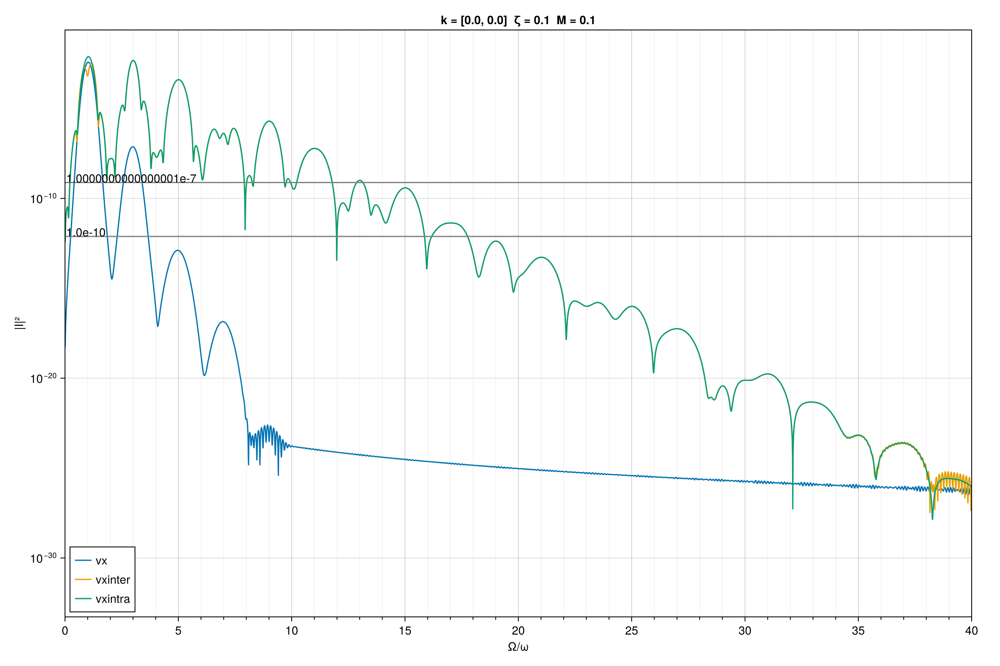

In [4]:
ζ    = 0.1
M    = 0.1
k    = [0.0,0.0]
sim  = makesim(M,ζ;kx=k[1],ky=k[2])
solver = SingleMode()
fns    = define_functions(sim,solver)
res    = run!(sim,fns,solver;savedata=false,saveplots=false)
p = getparams(sim)
fig = Damysos.plotpowerspectra(
    [res[1].vx,res[1].vxinter,res[1].vxintra],
    ["vx","vxinter","vxintra"],
    [p.ν,p.ν,p.ν],
    [p.dt,p.dt,p.dt];
    title = "k = $k  ζ = $ζ  M = $M")

In [6]:
ts = collect(gettsamples(sim))
fig = Damysos.plottimeseries(
    [res[1].vx,res[1].vxinter,res[1].vxintra],
    ["vx","vxinter","vxintra"],
    [ts,ts,ts];
    title = "k = $k  ζ = $ζ  M = $M")

ErrorException: type Array has no field vx

## Adding symmetry partners

┌ Info: ## Simulation{Float64}(0d)TwoBandDephasingLiouvillian(QuadraticToy)_GaussianAPulse (id: M=0.1_zeta=0.1_dt)
│ 
│ Starting on **pc1042350191** at **2024-09-16T13:31:55.073**:
│ 
│ * threads: 1
│ * processes: 1
│ * Solver: SingleMode()
│ * plotpath: ~/data
│ * datapath: ~/data
│ 
│ | Parameter | Value (SI units) | Value (scaled) |
│ |-----------|------------------|----------------|
│ | M | 0.1 |   |
│ | ζ | 0.1Δ  = 2.07 meV  | 0.6283185307179587 |
│ | m* | 9.71e-33 kg  | 9.999999999999995 |
│ | t2 | Inf fs  |   |
│ | σ | 300.0 fs  | 1.5 |
│ | ω | 0.0314 fs^-1  | 6.28 |
│ | ν | 5.0 THz  | 1.0 |
│ | eE | 0.00882 MV cm^-1  | 15.7 |
│ | φ | 0.0  | 0.0 |
│ | ħω | 0.0207 eV  | 6.28 |
│ | kx | 0.0136 Å^-1  | 8.0 |
│ | ky | 0.0 Å^-1  | 0.0 |
│ | t0 | -1500.0 fs  |   |
│ | dt | 0.8 fs  | 0.004 |
│ | nt | 3750.0  | 3750.0 |
│ | rtol | 1.0e-10  |   |
│ | atol | 1.0e-12  |   |
│ 
└ @ Damysos /home/how09898/.julia/dev/Damysos/src/Core.jl:133
┌ Info: ## Simulation{Float64}(0d)TwoBandDephasingLi

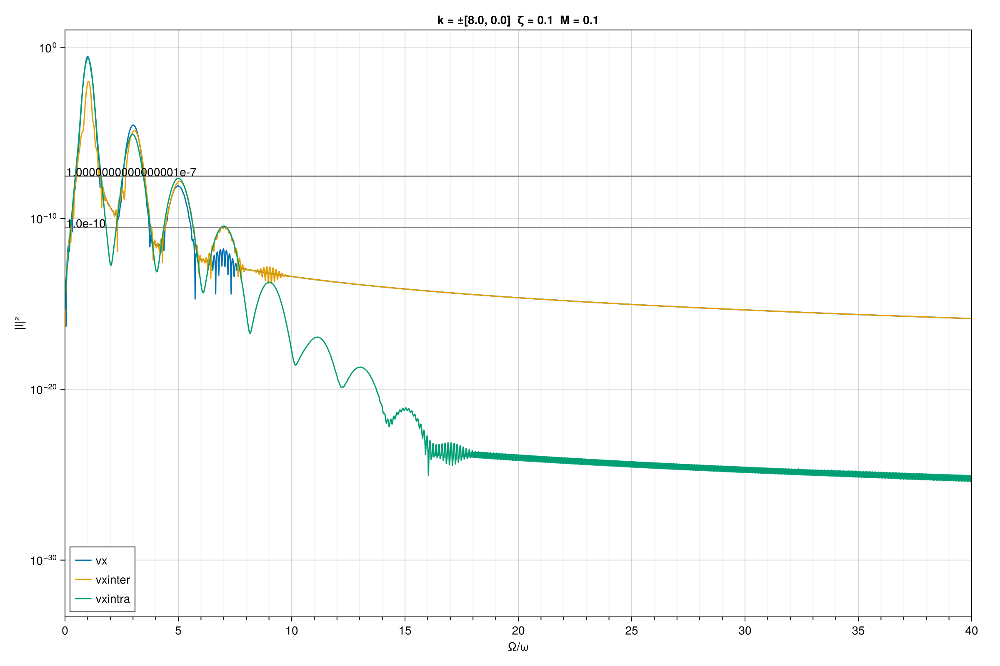

In [29]:
ζ    = 0.1
M    = 0.1
k    = [8.,0.]
# k    = [19.0,0.0] # (ζ,M) = (0.1,0.1)
# k    = [13.0,0.0] # (ζ,M) = (1,0.1)
# k    = [11.0,0.0] # (ζ,M) = (10,0.1)
sims  = [makesim(M,ζ;kx=_k[1],ky=_k[2]) for _k in [k,-k]]
solver = SingleMode()
fns    = [define_functions(s,solver) for s in sims]
res    = [run!(s,fs,solver;savedata=false,saveplots=false) for (s,fs) in zip(sims,fns)]
p = getparams(sims[1])
v_sum = res[1][1] + res[2][1]
fig = Damysos.plotpowerspectra(
    [v_sum.vx,v_sum.vxinter,v_sum.vxintra],
    ["vx","vxinter","vxintra"],
    [p.ν,p.ν,p.ν],
    [p.dt,p.dt,p.dt];
    title = "k = ±$k  ζ = $ζ  M = $M")

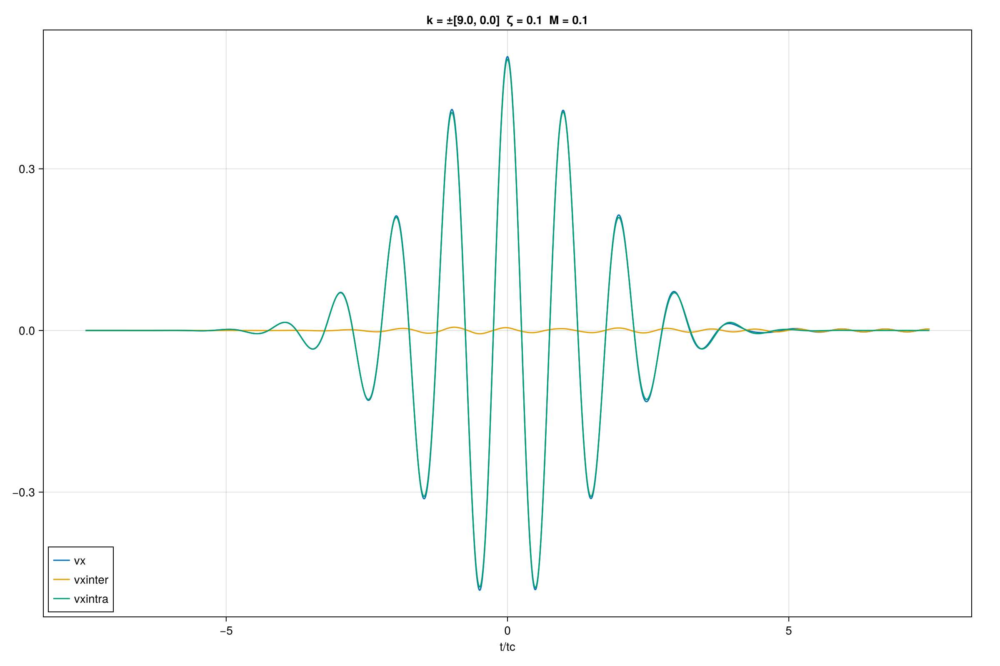

In [7]:
ts = collect(gettsamples(sim))
fig = Damysos.plottimeseries(
    [v_sum.vx,v_sum.vxinter,v_sum.vxintra],
    ["vx","vxinter","vxintra"],
    [ts,ts,ts];
    title = "k = ±$k  ζ = $ζ  M = $M")

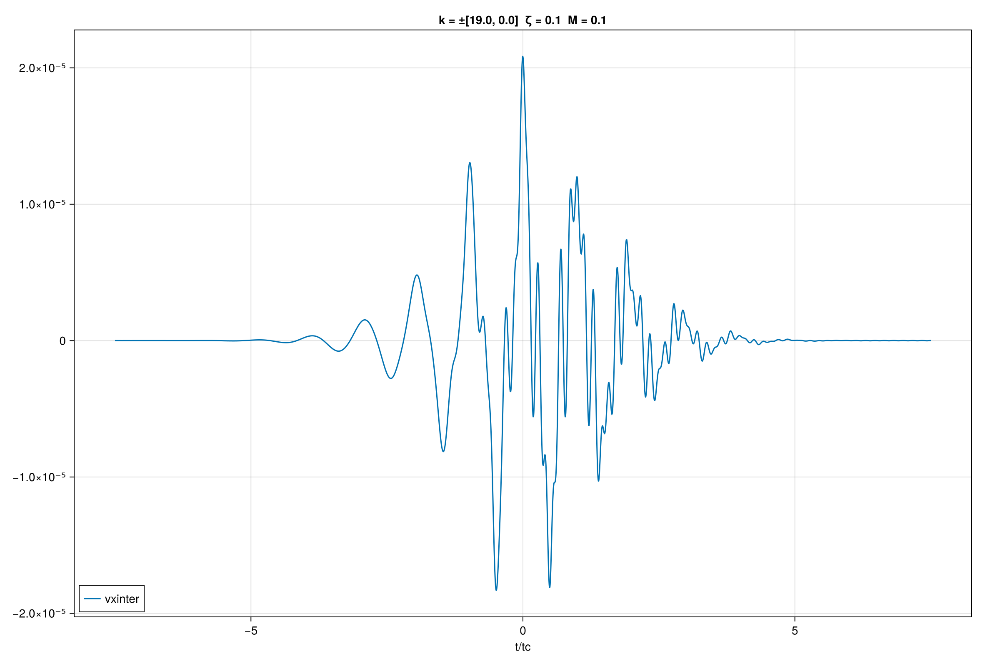

In [9]:
ts = collect(gettsamples(sim))
fig = Damysos.plottimeseries(
    [v_sum.vxinter],
    ["vxinter"],
    [ts];
    title = "k = ±$k  ζ = $ζ  M = $M")

## Using BZ mask weigths

In [15]:
ζ    = 0.1
M    = 0.1
k    = [19.0,0.0] # (ζ,M) = (0.1,0.1)
# k    = [13.0,0.0] # (ζ,M) = (1,0.1)
# k    = [11.0,0.0] # (ζ,M) = (10,0.1)
sims  = [makesim(M,ζ;kx=_k[1],ky=_k[2]) for _k in [k,-k]]
solver = SingleMode()
bz_masks = [Damysos.define_bzmask(s) for s in sims]

ErrorException: type NumericalParamsSingleMode has no field dkx

In [ ]:

fns    = [define_functions(s,solver) for s in sims]
res    = [run!(s,fs,solver;savedata=false,saveplots=false) for (s,fs) in zip(sims,fns)]
p = getparams(sims[1])
v_sum = res[1][1] + res[2][1]
fig = Damysos.plotpowerspectra(
    [v_sum.vx,v_sum.vxinter,v_sum.vxintra],
    ["vx","vxinter","vxintra"],
    [p.ν,p.ν,p.ν],
    [p.dt,p.dt,p.dt];
    title = "k = ±$k  ζ = $ζ  M = $M")

## Occupations

┌ Info: ## Simulation{Float64}(0d)TwoBandDephasingLiouvillian(QuadraticToy)_GaussianAPulse (id: M=0.1_zeta=0.1_dt)
│ 
│ Starting on **pc1042350191** at **2024-09-13T13:33:19.298**:
│ 
│ * threads: 1
│ * processes: 1
│ * Solver: SingleMode()
│ * plotpath: ~/data
│ * datapath: ~/data
│ 
│ | Parameter | Value (SI units) | Value (scaled) |
│ |-----------|------------------|----------------|
│ | M | 0.1 |   |
│ | ζ | 0.1Δ  = 2.07 meV  | 0.6283185307179587 |
│ | m* | 9.71e-33 kg  | 9.999999999999995 |
│ | t2 | Inf fs  |   |
│ | σ | 300.0 fs  | 1.5 |
│ | ω | 0.0314 fs^-1  | 6.28 |
│ | ν | 5.0 THz  | 1.0 |
│ | eE | 0.00882 MV cm^-1  | 15.7 |
│ | φ | 0.0  | 0.0 |
│ | ħω | 0.0207 eV  | 6.28 |
│ | kx | -0.0323 Å^-1  |   |
│ | ky | -0.0 Å^-1  |   |
│ | t0 | -1500.0 fs  |   |
│ | dt | 0.8 fs  | 0.004 |
│ | nt | 3750.0  | 3750.0 |
│ | rtol | 1.0e-10  |   |
│ | atol | 1.0e-12  |   |
│ 
└ @ Damysos /misc/rz_cloud/richter/how09898/.julia/dev/Damysos/src/Core.jl:133
┌ Info: ## Simulation{Float64}(0d)Two

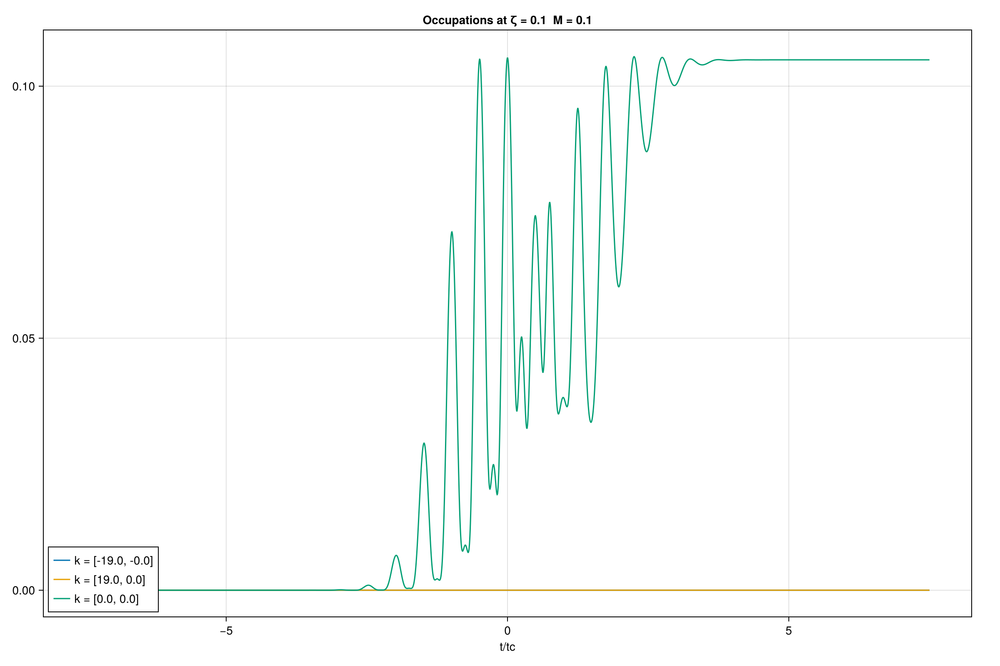

In [46]:
ζ    = 0.1
M    = 0.1
k    = [19.0,0.0] # (ζ,M) = (0.1,0.1)
# k    = [13.0,0.0] # (ζ,M) = (1,0.1)
# k    = [11.0,0.0] # (ζ,M) = (10,0.1)
ks      = [-k,k,[0,0]]
sims  = [makesim(M,ζ;kx=_k[1],ky=_k[2]) for _k in ks]
solver = SingleMode()
fns    = [define_functions(s,solver) for s in sims]
res    = [run!(s,fs,solver;savedata=false,saveplots=false) for (s,fs) in zip(sims,fns)]
p = getparams(sims[1])
fig = Damysos.plottimeseries(
    [s.observables[2].cbocc for s in sims],
    ["k = $k" for k in ks],
    [collect(gettsamples(s)) for s in sims];
    title = "Occupations at ζ = $ζ  M = $M")

┌ Info: ## Simulation{Float64}(0d)TwoBandDephasingLiouvillian(QuadraticToy)_GaussianAPulse (id: M=0.1_zeta=0.1_dt)
│ 
│ Starting on **pc1042350191** at **2024-09-13T13:33:34.162**:
│ 
│ * threads: 1
│ * processes: 1
│ * Solver: SingleMode()
│ * plotpath: ~/data
│ * datapath: ~/data
│ 
│ | Parameter | Value (SI units) | Value (scaled) |
│ |-----------|------------------|----------------|
│ | M | 0.1 |   |
│ | ζ | 0.1Δ  = 2.07 meV  | 0.6283185307179587 |
│ | m* | 9.71e-33 kg  | 9.999999999999995 |
│ | t2 | Inf fs  |   |
│ | σ | 300.0 fs  | 1.5 |
│ | ω | 0.0314 fs^-1  | 6.28 |
│ | ν | 5.0 THz  | 1.0 |
│ | eE | 0.00882 MV cm^-1  | 15.7 |
│ | φ | 0.0  | 0.0 |
│ | ħω | 0.0207 eV  | 6.28 |
│ | kx | -0.0323 Å^-1  |   |
│ | ky | -0.0 Å^-1  |   |
│ | t0 | -1500.0 fs  |   |
│ | dt | 0.8 fs  | 0.004 |
│ | nt | 3750.0  | 3750.0 |
│ | rtol | 1.0e-10  |   |
│ | atol | 1.0e-12  |   |
│ 
└ @ Damysos /misc/rz_cloud/richter/how09898/.julia/dev/Damysos/src/Core.jl:133
┌ Info: ## Simulation{Float64}(0d)Two

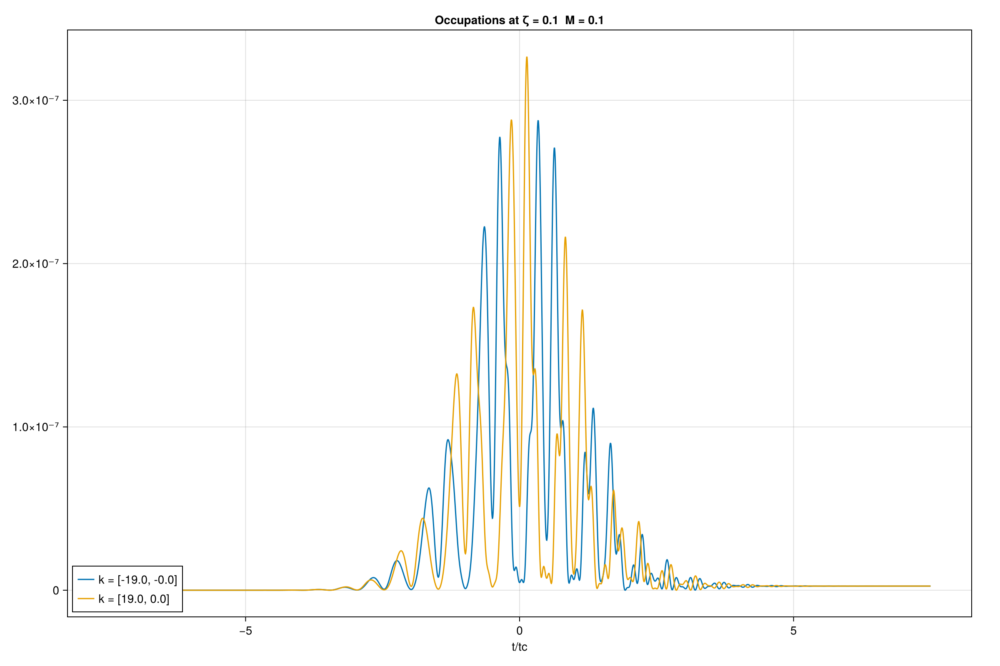

In [47]:
ζ    = 0.1
M    = 0.1
k    = [19.0,0.0] # (ζ,M) = (0.1,0.1)
# k    = [13.0,0.0] # (ζ,M) = (1,0.1)
# k    = [11.0,0.0] # (ζ,M) = (10,0.1)
ks      = [-k,k]
sims  = [makesim(M,ζ;kx=_k[1],ky=_k[2]) for _k in ks]
solver = SingleMode()
fns    = [define_functions(s,solver) for s in sims]
res    = [run!(s,fs,solver;savedata=false,saveplots=false) for (s,fs) in zip(sims,fns)]
p = getparams(sims[1])
fig = Damysos.plottimeseries(
    [s.observables[2].cbocc for s in sims],
    ["k = $k" for k in ks],
    [collect(gettsamples(s)) for s in sims];
    title = "Occupations at ζ = $ζ  M = $M")

## Adding partners & zero mode

┌ Info: ## Simulation{Float64}(0d)TwoBandDephasingLiouvillian(QuadraticToy)_GaussianAPulse (id: M=0.1_zeta=0.1_dt)
│ 
│ Starting on **pc1042350191** at **2024-09-13T11:01:25.788**:
│ 
│ * threads: 1
│ * processes: 1
│ * Solver: SingleMode()
│ * plotpath: ~/data
│ * datapath: ~/data
│ 
│ | Parameter | Value (SI units) | Value (scaled) |
│ |-----------|------------------|----------------|
│ | M | 0.1 |   |
│ | ζ | 0.1Δ  = 2.07 meV  | 0.6283185307179587 |
│ | m* | 9.71e-33 kg  | 9.999999999999995 |
│ | t2 | Inf fs  |   |
│ | σ | 300.0 fs  | 1.5 |
│ | ω | 0.0314 fs^-1  | 6.28 |
│ | ν | 5.0 THz  | 1.0 |
│ | eE | 0.00882 MV cm^-1  | 15.7 |
│ | φ | 0.0  | 0.0 |
│ | ħω | 0.0207 eV  | 6.28 |
│ | kx | 0.0323 Å^-1  | 19.0 |
│ | ky | 0.0 Å^-1  | 0.0 |
│ | t0 | -1500.0 fs  |   |
│ | dt | 0.8 fs  | 0.004 |
│ | nt | 3750.0  | 3750.0 |
│ | rtol | 1.0e-10  |   |
│ | atol | 1.0e-12  |   |
│ 
└ @ Damysos /misc/rz_cloud/richter/how09898/.julia/dev/Damysos/src/Core.jl:133
┌ Info: ## Simulation{Float64}(0d)

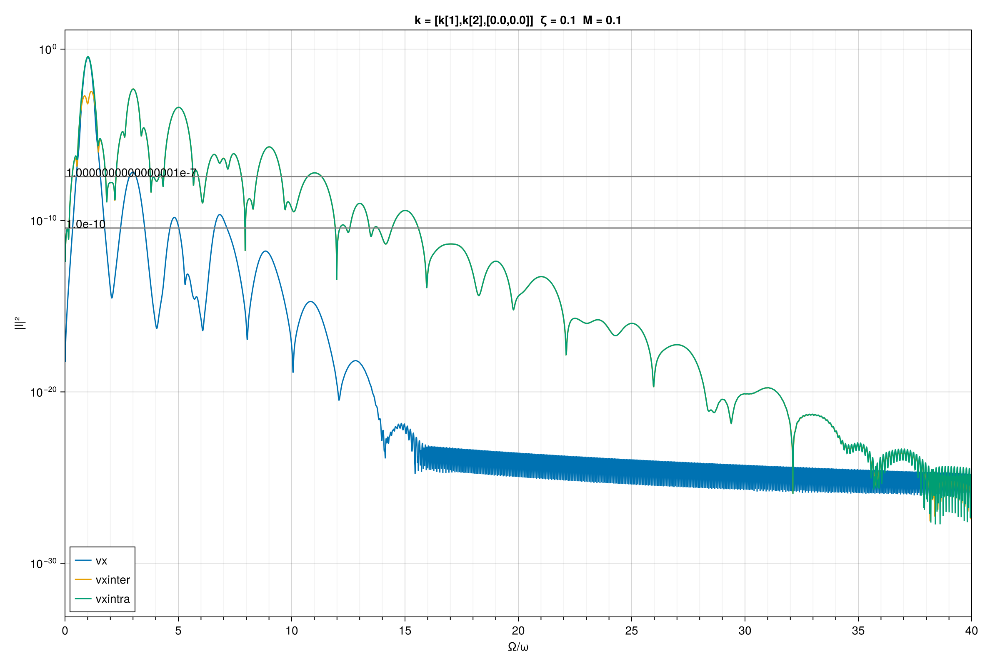

In [11]:
ζ    = 0.1
M    = 0.1
k    = [19.0,0.0] # (ζ,M) = (0.1,0.1)
# k    = [13.0,0.0] # (ζ,M) = (1,0.1)
# k    = [11.0,0.0] # (ζ,M) = (10,0.1)
sims  = [makesim(M,ζ;kx=_k[1],ky=_k[2]) for _k in [k,-k,[0.0,0.0]]]
solver = SingleMode()
fns    = [define_functions(s,solver) for s in sims]
res    = [run!(s,fs,solver;savedata=false,saveplots=false) for (s,fs) in zip(sims,fns)]
p = getparams(sims[1])
vs = [r[1] for r in res]
v_sum = sum(vs)
fig = Damysos.plotpowerspectra(
    [v_sum.vx,v_sum.vxinter,v_sum.vxintra],
    ["vx","vxinter","vxintra"],
    [p.ν,p.ν,p.ν],
    [p.dt,p.dt,p.dt];
    title = "k = [k[1],k[2],[0.0,0.0]]  ζ = $ζ  M = $M")

## Going away from [0,0] in ky-direction

┌ Info: ## Simulation{Float64}(0d)TwoBandDephasingLiouvillian(QuadraticToy)_GaussianAPulse (id: M=0.1_zeta=0.1_dt)
│ 
│ Starting on **pc1042350191** at **2024-09-11T15:24:14.581**:
│ 
│ * threads: 1
│ * processes: 1
│ * Solver: SingleMode()
│ * plotpath: ~/data
│ * datapath: ~/data
│ 
│ | Parameter | Value (SI units) | Value (scaled) |
│ |-----------|------------------|----------------|
│ | M | 0.1 |   |
│ | ζ | 0.1Δ  = 2.07 meV  | 0.6283185307179587 |
│ | m* | 9.71e-33 kg  | 9.999999999999995 |
│ | t2 | Inf fs  |   |
│ | σ | 300.0 fs  | 1.5 |
│ | ω | 0.0314 fs^-1  | 6.28 |
│ | ν | 5.0 THz  | 1.0 |
│ | eE | 0.00882 MV cm^-1  | 15.7 |
│ | φ | 0.0  | 0.0 |
│ | ħω | 0.0207 eV  | 6.28 |
│ | kx | 0.0 Å^-1  | 0.0 |
│ | ky | 0.00851 Å^-1  | 5.0 |
│ | t0 | -1500.0 fs  |   |
│ | dt | 0.8 fs  | 0.004 |
│ | nt | 3750.0  | 3750.0 |
│ | rtol | 1.0e-10  |   |
│ | atol | 1.0e-12  |   |
│ 
└ @ Damysos /misc/rz_cloud/richter/how09898/.julia/dev/Damysos/src/Core.jl:133


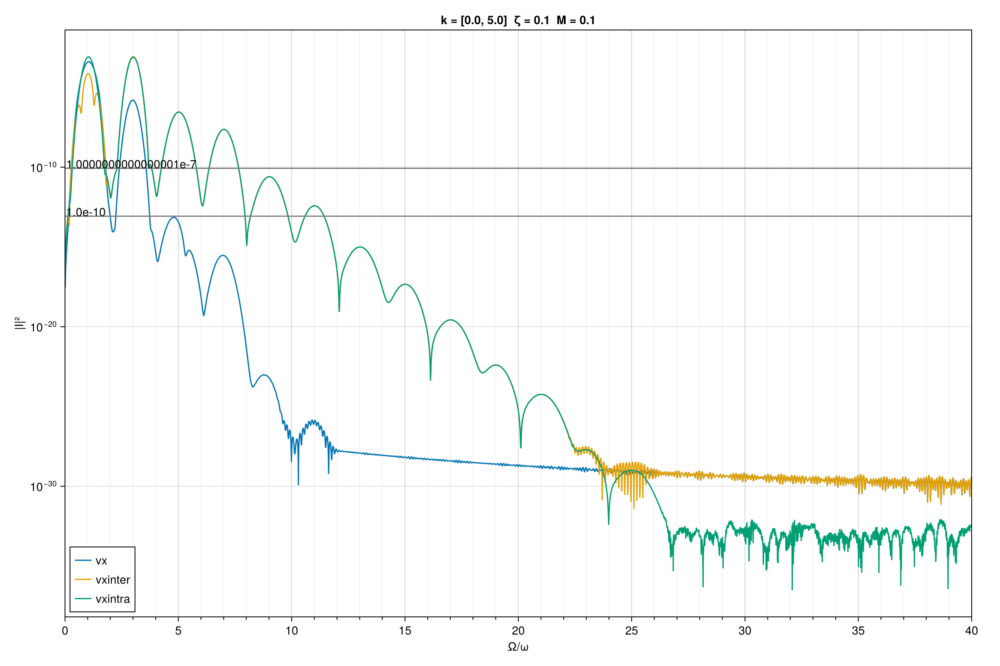

In [41]:
ζ    = 0.1
M    = 0.1
k    = [0.0,5.0]
sim  = makesim(M,ζ;kx=k[1],ky=k[2])
solver = SingleMode()
fns    = define_functions(sim,solver)
res    = run!(sim,fns,solver;savedata=false,saveplots=false)
p = getparams(sim)
fig = Damysos.plotpowerspectra(
    [res[1].vx,res[1].vxinter,res[1].vxintra],
    ["vx","vxinter","vxintra"],
    [p.ν,p.ν,p.ν],
    [p.dt,p.dt,p.dt];
    title = "k = $k  ζ = $ζ  M = $M")

# Dirac case

## Define Simulation

In [34]:
function makesim_dirac(M = 0.5, ζ = 4.0;
	kx=0.0,
	ky=0.0,
	datapath = "~/data", 
	plotpath = datapath)

	ħ = Unitful.ħ
	vf = u"497070.0m/s"
	freq = u"5.0THz"
	# emax      = u"0.5MV/cm"
	e = uconvert(u"C", 1u"eV" / 1u"V")
	ω = 2π * freq
	m = M * ħ * ω / 2

	σ = uconvert(u"fs", 1.5 / freq)
	emax = uconvert(u"MV/cm", ζ * ħ * ω^2 / (2vf * e))
	us = scaledriving_frequency(freq, vf)

	t2 = Inf * u"s"
	t1 = Inf * u"s"

	h  = GappedDirac(energyscaled(m, us))
	l  = TwoBandDephasingLiouvillian(h, timescaled(t1, us), timescaled(t2, us))
	df = GaussianAPulse(us, σ, freq, emax)

	dt 	  = 0.004

	pars = NumericalParamsSingleMode(kx, ky, dt, -5df.σ)
	obs  = [Velocity(pars), Occupation(pars)]

	id = "M=$(M)_zeta=$(ζ)"

	return Simulation(l, df, pars, obs, us, id, datapath, plotpath)
end


makesim_dirac (generic function with 3 methods)

## Single mode

┌ Info: ## Simulation{Float64}(0d)TwoBandDephasingLiouvillian(GappedDirac)_GaussianAPulse (id: M=0.1_zeta=0.1)
│ 
│ Starting on **pc1042350191** at **2024-09-16T13:33:54.273**:
│ 
│ * threads: 1
│ * processes: 1
│ * Solver: SingleMode()
│ * plotpath: ~/data
│ * datapath: ~/data
│ 
│ | Parameter | Value (SI units) | Value (scaled) |
│ |-----------|------------------|----------------|
│ | ζ | 0.1 |   |
│ | γ | 0.5 |   |
│ | M | 0.1 |   |
│ | plz | 0.855 |   |
│ | m | 1.03 meV  | 0.3141592653589793 |
│ | vF | 497000.0 m s^-1  | 1.0 |
│ | t2 | Inf fs  |   |
│ | σ | 300.0 fs  | 1.5 |
│ | ω | 0.0314 fs^-1  | 6.28 |
│ | ν | 5.0 THz  | 1.0 |
│ | eE | 0.000653 MV cm^-1  | 1.97 |
│ | φ | 0.0  | 0.0 |
│ | ħω | 0.0207 eV  | 6.28 |
│ | kx | 0.0 Å^-1  | 0.0 |
│ | ky | 0.0 Å^-1  | 0.0 |
│ | t0 | -1500.0 fs  |   |
│ | dt | 0.8 fs  | 0.004 |
│ | nt | 3750.0  | 3750.0 |
│ | rtol | 1.0e-10  |   |
│ | atol | 1.0e-12  |   |
│ 
└ @ Damysos /home/how09898/.julia/dev/Damysos/src/Core.jl:133


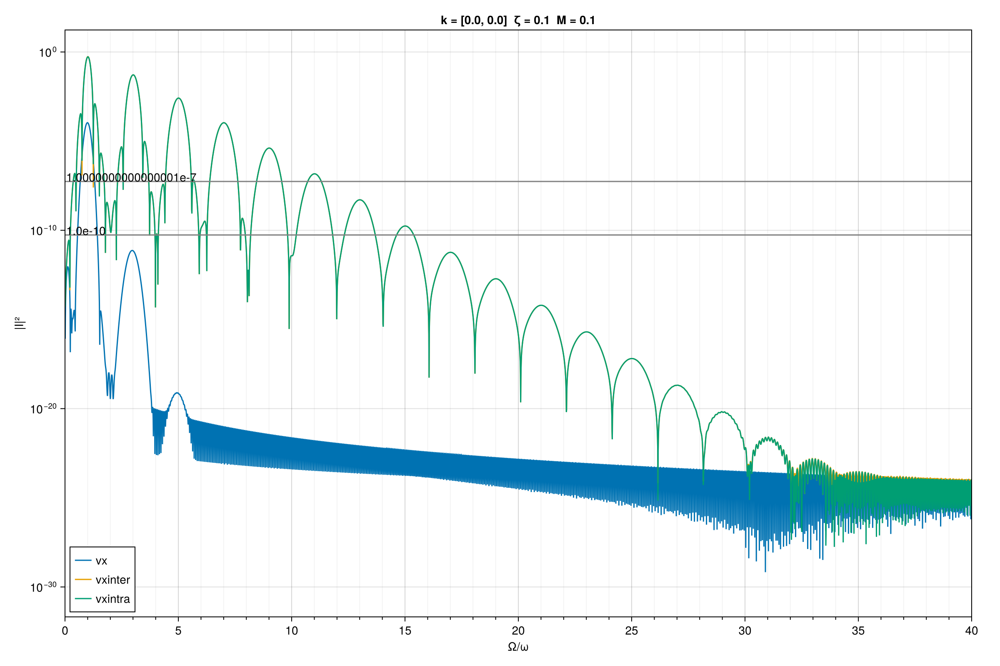

In [35]:
ζ    = 0.1
M    = 0.1
k    = [0.0,0.0]
sim  = makesim_dirac(M,ζ;kx=k[1],ky=k[2])
solver = SingleMode()
fns    = define_functions(sim,solver)
res    = run!(sim,fns,solver;savedata=false,saveplots=false)
p = getparams(sim)
fig = Damysos.plotpowerspectra(
    [res[1].vx,res[1].vxinter,res[1].vxintra],
    ["vx","vxinter","vxintra"],
    [p.ν,p.ν,p.ν],
    [p.dt,p.dt,p.dt];
    title = "k = $k  ζ = $ζ  M = $M")

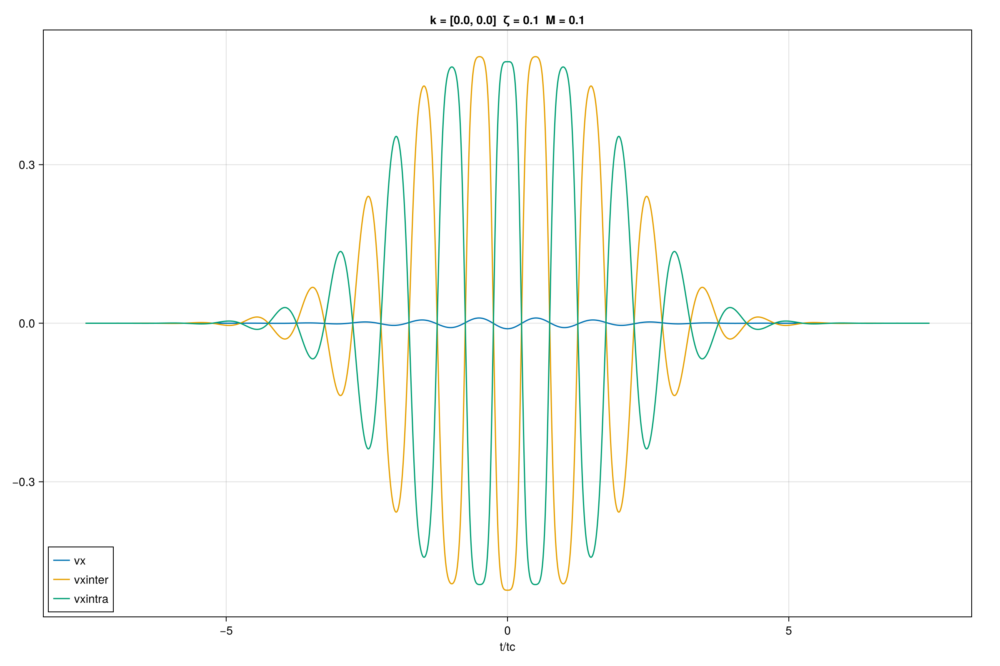

In [13]:
ts = collect(gettsamples(sim))
fig = Damysos.plottimeseries(
    [res[1].vx,res[1].vxinter,res[1].vxintra],
    ["vx","vxinter","vxintra"],
    [ts,ts,ts];
    title = "k = $k  ζ = $ζ  M = $M")

## Adding symmetry partners

┌ Info: ## Simulation{Float64}(0d)TwoBandDephasingLiouvillian(GappedDirac)_GaussianAPulse (id: M=0.1_zeta=0.1)
│ 
│ Starting on **pc1042350191** at **2024-09-16T15:27:36.065**:
│ 
│ * threads: 1
│ * processes: 1
│ * Solver: SingleMode()
│ * plotpath: ~/data
│ * datapath: ~/data
│ 
│ | Parameter | Value (SI units) | Value (scaled) |
│ |-----------|------------------|----------------|
│ | ζ | 0.1 |   |
│ | γ | 0.5 |   |
│ | M | 0.1 |   |
│ | plz | 0.855 |   |
│ | m | 1.03 meV  | 0.3141592653589793 |
│ | vF | 497000.0 m s^-1  | 1.0 |
│ | t2 | Inf fs  |   |
│ | σ | 300.0 fs  | 1.5 |
│ | ω | 0.0314 fs^-1  | 6.28 |
│ | ν | 5.0 THz  | 1.0 |
│ | eE | 0.000653 MV cm^-1  | 1.97 |
│ | φ | 0.0  | 0.0 |
│ | ħω | 0.0207 eV  | 6.28 |
│ | kx | 0.00302 Å^-1  | 3.0 |
│ | ky | 0.0 Å^-1  | 0.0 |
│ | t0 | -1500.0 fs  |   |
│ | dt | 0.8 fs  | 0.004 |
│ | nt | 3750.0  | 3750.0 |
│ | rtol | 1.0e-10  |   |
│ | atol | 1.0e-12  |   |
│ 
└ @ Damysos /home/how09898/.julia/dev/Damysos/src/Core.jl:133
┌ Info: ## Sim

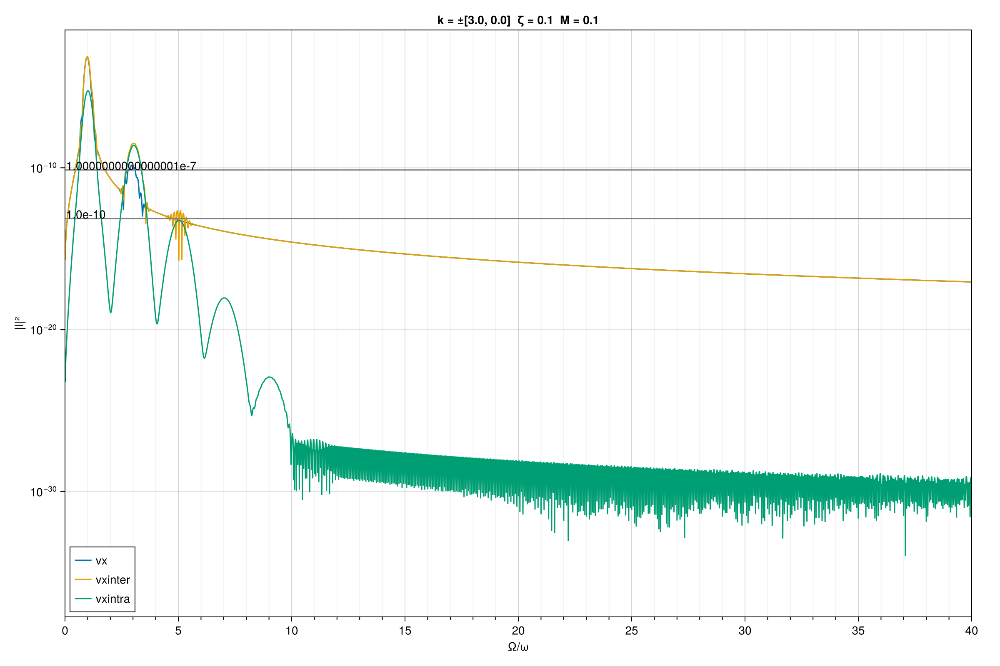

In [74]:
ζ    = 0.1
M    = 0.1
k    = [3.0,0.0]
# k    = [10.0,0.0] # (ζ,M) = (0.1,0.1)
# k    = [20.0,0.0] # (ζ,M) = (1,0.1)
# k    = [140.0,0.0] # (ζ,M) = (10,0.1)
sims  = [makesim_dirac(M,ζ;kx=_k[1],ky=_k[2]) for _k in [k,-k]]
solver = SingleMode()
fns    = [define_functions(s,solver) for s in sims]
res    = [run!(s,fs,solver;savedata=false,saveplots=false) for (s,fs) in zip(sims,fns)]
p = getparams(sims[1])
v_sum = res[1][1] + res[2][1]
fig = Damysos.plotpowerspectra(
    [v_sum.vx,v_sum.vxinter,v_sum.vxintra],
    ["vx","vxinter","vxintra"],
    [p.ν,p.ν,p.ν],
    [p.dt,p.dt,p.dt];
    title = "k = ±$k  ζ = $ζ  M = $M")

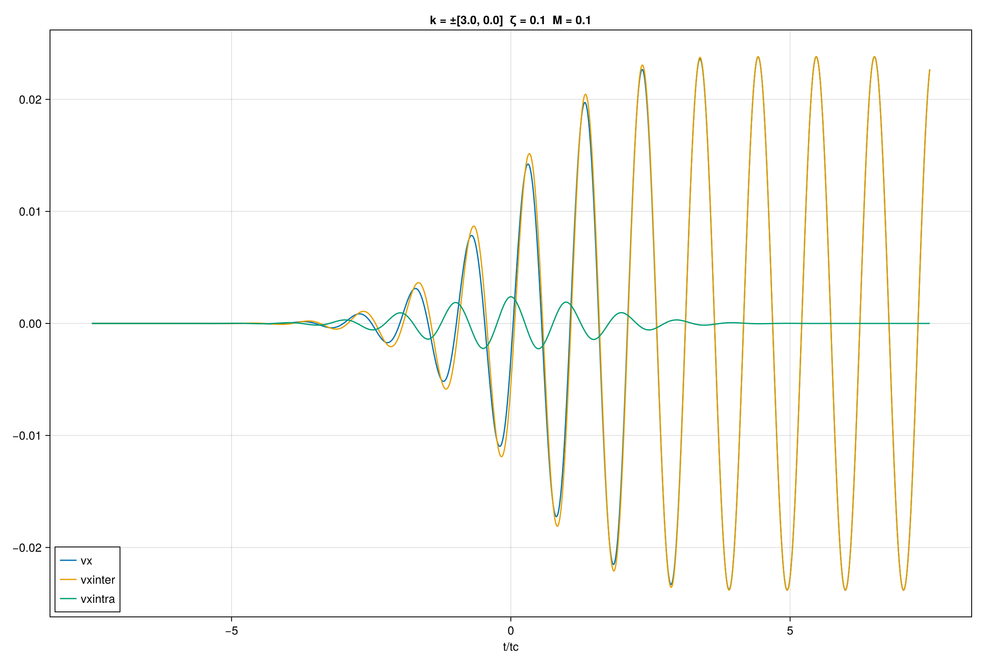

In [76]:
ts = collect(gettsamples(sims[1]))
fig = Damysos.plottimeseries(
    [v_sum.vx,v_sum.vxinter,v_sum.vxintra],
    ["vx","vxinter","vxintra"],
    [ts,ts,ts];
    title = "k = ±$k  ζ = $ζ  M = $M")

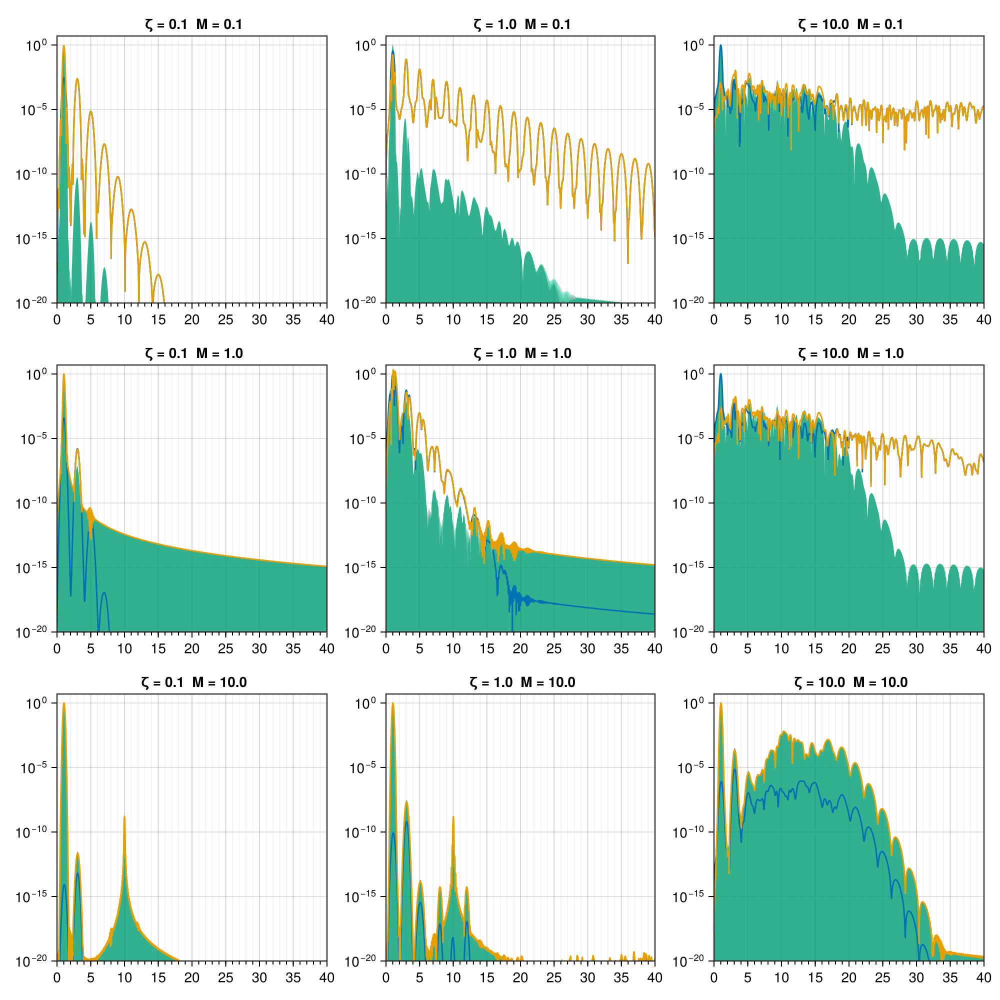

In [ ]:
fig   = Figure(size=(1000,1000))
ii = CartesianIndices((1:3,1:3))
maxharm = 40
for i in 1:9
    ζ,M = match(r"zeta=([0-9.]+)_M=([0-9.]+)",diracfiles[i]).captures
    p = getparams(diracsims[i])
    v = diracvels[i]
    specdata = [Damysos.calculate_spectrum(data,p.dt) for data in [v.vx,v.vxintra,v.vxinter]]
    specdata = [(data[1][data[2] .> 1e-50],data[2][data[2] .> 1e-50]) for data in specdata]

    norm = maximum(specdata[1][2])

    ax  = Axis(fig[ii[i][1],ii[i][2]],
        title=" ζ = $ζ  M = $M",
        yscale=log10,
        xminorticksvisible=true,
        xminorgridvisible=true,
        xminorticks=0:1:maxharm,
        xticks=0:5:maxharm)
    band!(ax,specdata[1][1],fill(1e-50,length(specdata[1][1])),specdata[1][2] ./norm,color=Cycled(3))
    for data in specdata[2:3]
        lines!(ax,data[1],data[2] ./ norm)
    end
    xlims!(ax,(0,40))
    ylims!(ax,(1e-20,5))
end

fig

## Occupations

┌ Info: ## Simulation{Float64}(0d)TwoBandDephasingLiouvillian(GappedDirac)_GaussianAPulse (id: M=0.1_zeta=0.1)
│ 
│ Starting on **pc1042350191** at **2024-09-13T13:32:40.370**:
│ 
│ * threads: 1
│ * processes: 1
│ * Solver: SingleMode()
│ * plotpath: ~/data
│ * datapath: ~/data
│ 
│ | Parameter | Value (SI units) | Value (scaled) |
│ |-----------|------------------|----------------|
│ | ζ | 0.1 |   |
│ | γ | 0.5 |   |
│ | M | 0.1 |   |
│ | plz | 0.855 |   |
│ | m | 1.03 meV  | 0.3141592653589793 |
│ | vF | 497000.0 m s^-1  | 1.0 |
│ | t2 | Inf fs  |   |
│ | σ | 300.0 fs  | 1.5 |
│ | ω | 0.0314 fs^-1  | 6.28 |
│ | ν | 5.0 THz  | 1.0 |
│ | eE | 0.000653 MV cm^-1  | 1.97 |
│ | φ | 0.0  | 0.0 |
│ | ħω | 0.0207 eV  | 6.28 |
│ | kx | -0.0101 Å^-1  |   |
│ | ky | -0.0 Å^-1  |   |
│ | t0 | -1500.0 fs  |   |
│ | dt | 0.8 fs  | 0.004 |
│ | nt | 3750.0  | 3750.0 |
│ | rtol | 1.0e-10  |   |
│ | atol | 1.0e-12  |   |
│ 
└ @ Damysos /misc/rz_cloud/richter/how09898/.julia/dev/Damysos/src/Core.jl:133


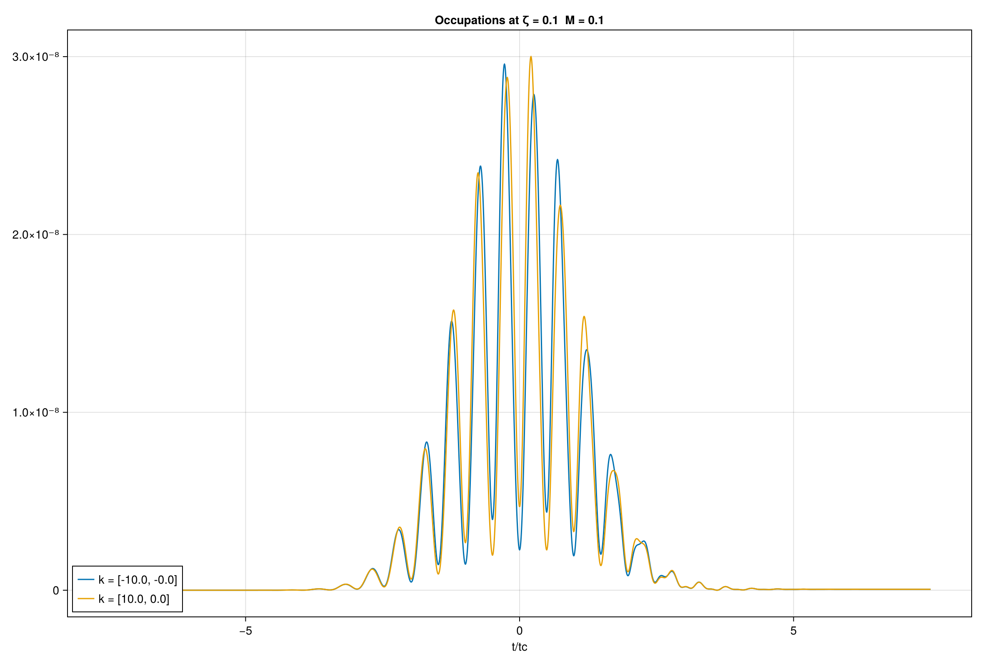

In [44]:
ζ    = 0.1
M    = 0.1
k    = [10.0,0.0] # (ζ,M) = (0.1,0.1)
# k    = [20.0,0.0] # (ζ,M) = (1,0.1)
# k    = [140.0,0.0] # (ζ,M) = (10,0.1)
ks      = [-k,k]
sims  = [makesim_dirac(M,ζ;kx=_k[1],ky=_k[2]) for _k in ks]
solver = SingleMode()
fns    = [define_functions(s,solver) for s in sims]
res    = [run!(s,fs,solver;savedata=false,saveplots=false) for (s,fs) in zip(sims,fns)]
p = getparams(sims[1])
fig = Damysos.plottimeseries(
    [s.observables[2].cbocc for s in sims],
    ["k = $k" for k in ks],
    [collect(gettsamples(s)) for s in sims];
    title = "Occupations at ζ = $ζ  M = $M")

┌ Info: ## Simulation{Float64}(0d)TwoBandDephasingLiouvillian(GappedDirac)_GaussianAPulse (id: M=0.1_zeta=0.1)
│ 
│ Starting on **pc1042350191** at **2024-09-13T13:33:01.977**:
│ 
│ * threads: 1
│ * processes: 1
│ * Solver: SingleMode()
│ * plotpath: ~/data
│ * datapath: ~/data
│ 
│ | Parameter | Value (SI units) | Value (scaled) |
│ |-----------|------------------|----------------|
│ | ζ | 0.1 |   |
│ | γ | 0.5 |   |
│ | M | 0.1 |   |
│ | plz | 0.855 |   |
│ | m | 1.03 meV  | 0.3141592653589793 |
│ | vF | 497000.0 m s^-1  | 1.0 |
│ | t2 | Inf fs  |   |
│ | σ | 300.0 fs  | 1.5 |
│ | ω | 0.0314 fs^-1  | 6.28 |
│ | ν | 5.0 THz  | 1.0 |
│ | eE | 0.000653 MV cm^-1  | 1.97 |
│ | φ | 0.0  | 0.0 |
│ | ħω | 0.0207 eV  | 6.28 |
│ | kx | -0.0101 Å^-1  |   |
│ | ky | -0.0 Å^-1  |   |
│ | t0 | -1500.0 fs  |   |
│ | dt | 0.8 fs  | 0.004 |
│ | nt | 3750.0  | 3750.0 |
│ | rtol | 1.0e-10  |   |
│ | atol | 1.0e-12  |   |
│ 
└ @ Damysos /misc/rz_cloud/richter/how09898/.julia/dev/Damysos/src/Core.jl:133


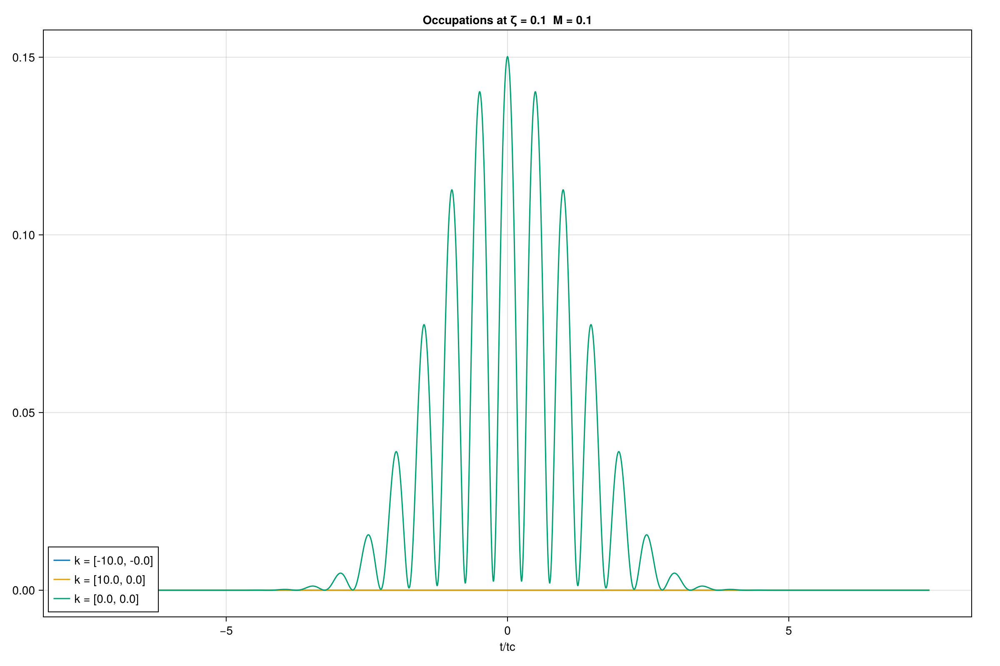

In [45]:
ζ    = 0.1
M    = 0.1
k    = [10.0,0.0] # (ζ,M) = (0.1,0.1)
# k    = [20.0,0.0] # (ζ,M) = (1,0.1)
# k    = [140.0,0.0] # (ζ,M) = (10,0.1)
ks      = [-k,k,[0,0]]
sims  = [makesim_dirac(M,ζ;kx=_k[1],ky=_k[2]) for _k in ks]
solver = SingleMode()
fns    = [define_functions(s,solver) for s in sims]
res    = [run!(s,fs,solver;savedata=false,saveplots=false) for (s,fs) in zip(sims,fns)]
p = getparams(sims[1])
fig = Damysos.plottimeseries(
    [s.observables[2].cbocc for s in sims],
    ["k = $k" for k in ks],
    [collect(gettsamples(s)) for s in sims];
    title = "Occupations at ζ = $ζ  M = $M")

# Comparing bandstructure, velocities & dipoles

In [43]:
ζ    = 0.1
M    = 0.1
quadsim  = makesim(M,ζ;kx=0,ky=0)
diracsim = makesim_dirac(M,ζ;kx=0,ky=0)
en_quad = getΔϵ(quadsim)
en_dirac = getΔϵ(diracsim)

#16 (generic function with 1 method)

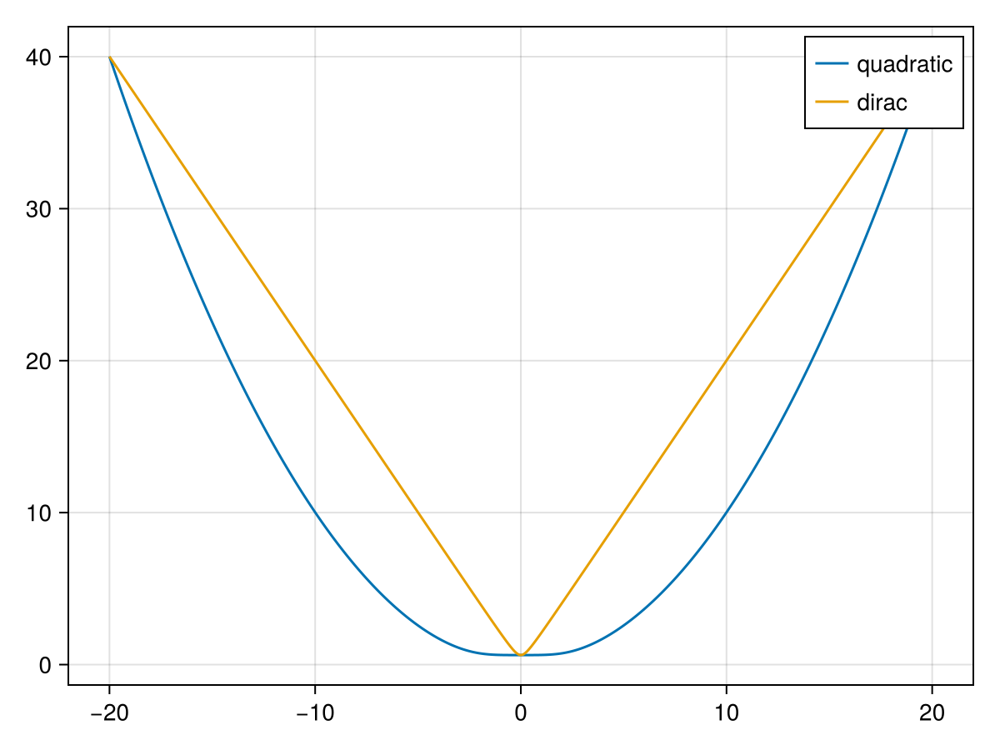

In [44]:
using CairoMakie
ks = -20:0.1:20
fig,ax,pl = lines(ks,en_quad.(ks,0),label="quadratic")
lines!(ax,ks,en_dirac.(ks,0),label="dirac")
axislegend(ax)
fig

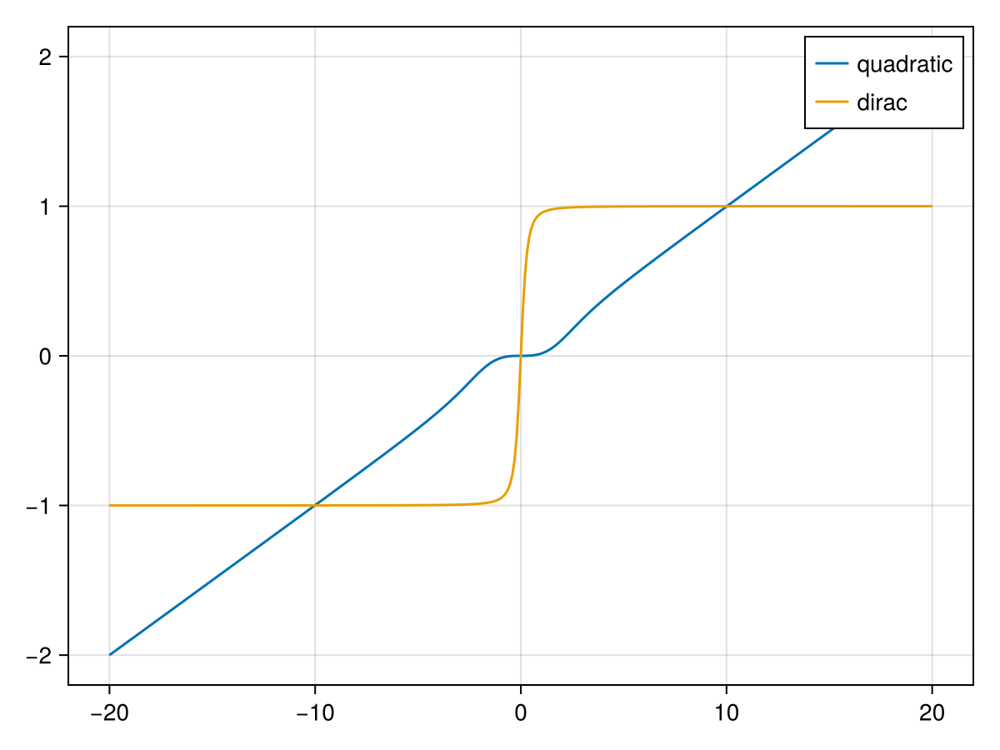

In [45]:
ks = -20:0.1:20
vx_quad = getvx_cc(quadsim)
vx_dirac = getvx_cc(diracsim)
fig,ax,pl = lines(ks,vx_quad.(ks,0),label="quadratic")
lines!(ax,ks,vx_dirac.(ks,0),label="dirac")
axislegend(ax)
fig

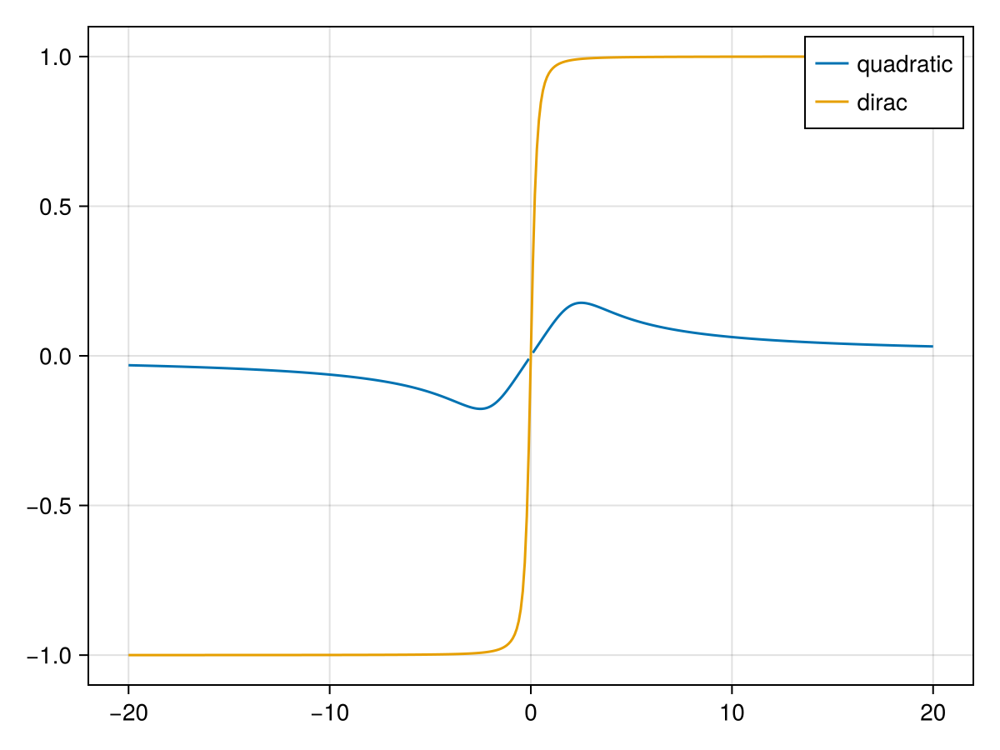

In [47]:
ks = -20:0.1:20
vxcv_quad = getvx_cv(quadsim)
vxcv_dirac = getvx_cv(diracsim)
fig,ax,pl = lines(ks,real.(vxcv_quad.(ks,0)),label="quadratic")
lines!(ax,ks,real.(vx_dirac.(ks,0)),label="dirac")
axislegend(ax)
fig

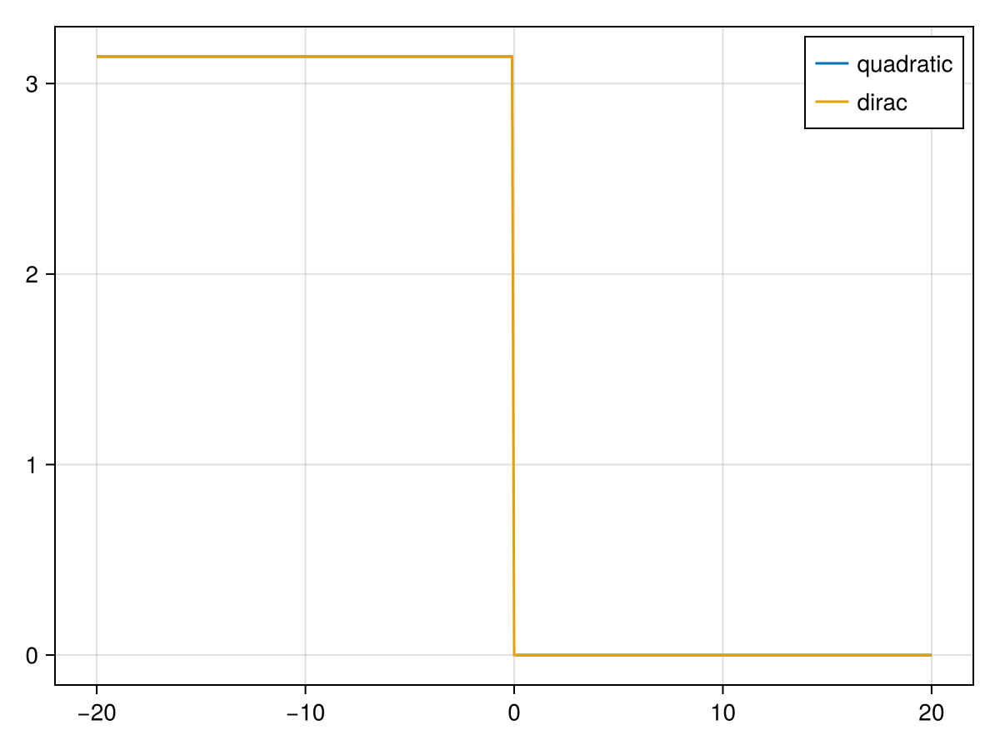

In [33]:
ks = -20:0.1:20
vxcv_quad = getvx_cv(quadsim)
vxcv_dirac = getvx_cv(diracsim)
fig,ax,pl = lines(ks,angle.(vxcv_quad.(ks,0)),label="quadratic")
lines!(ax,ks,angle.(vx_dirac.(ks,0)),label="dirac")
axislegend(ax)
fig

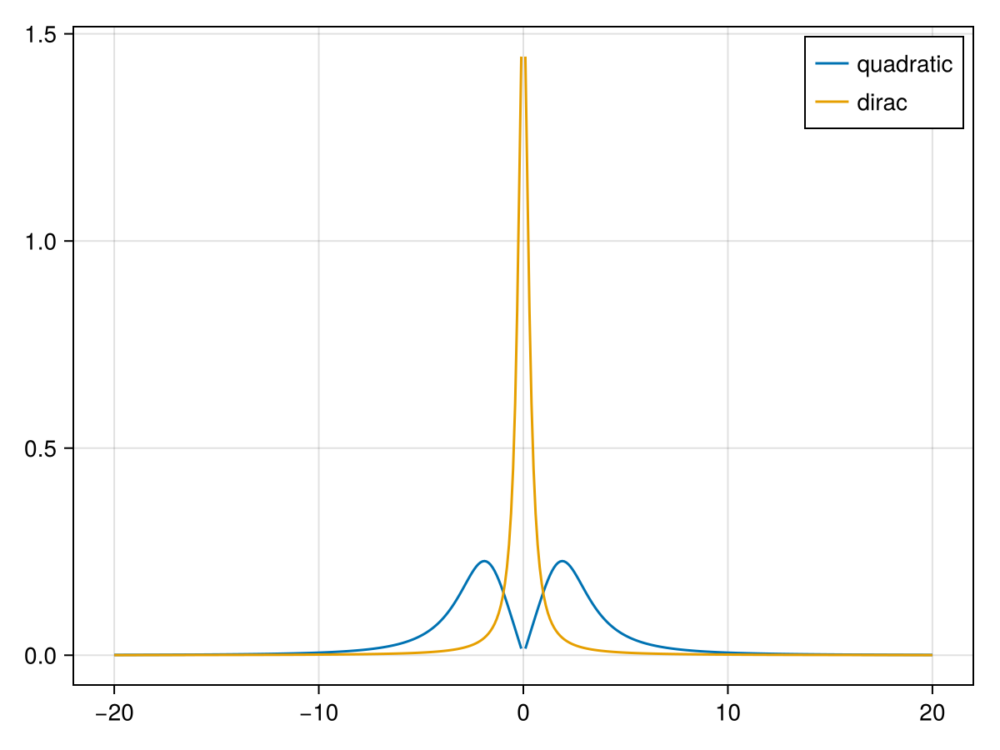

In [48]:
ks = -20:0.1:20
dxcv_quad = getdx_cv(quadsim.liouvillian.hamiltonian)
dxcv_dirac = getdx_cv(diracsim.liouvillian.hamiltonian)
fig,ax,pl = lines(ks,abs.(dxcv_quad.(ks,0)),label="quadratic")
lines!(ax,ks,abs.(dxcv_dirac.(ks,0)),label="dirac")
axislegend(ax)
fig

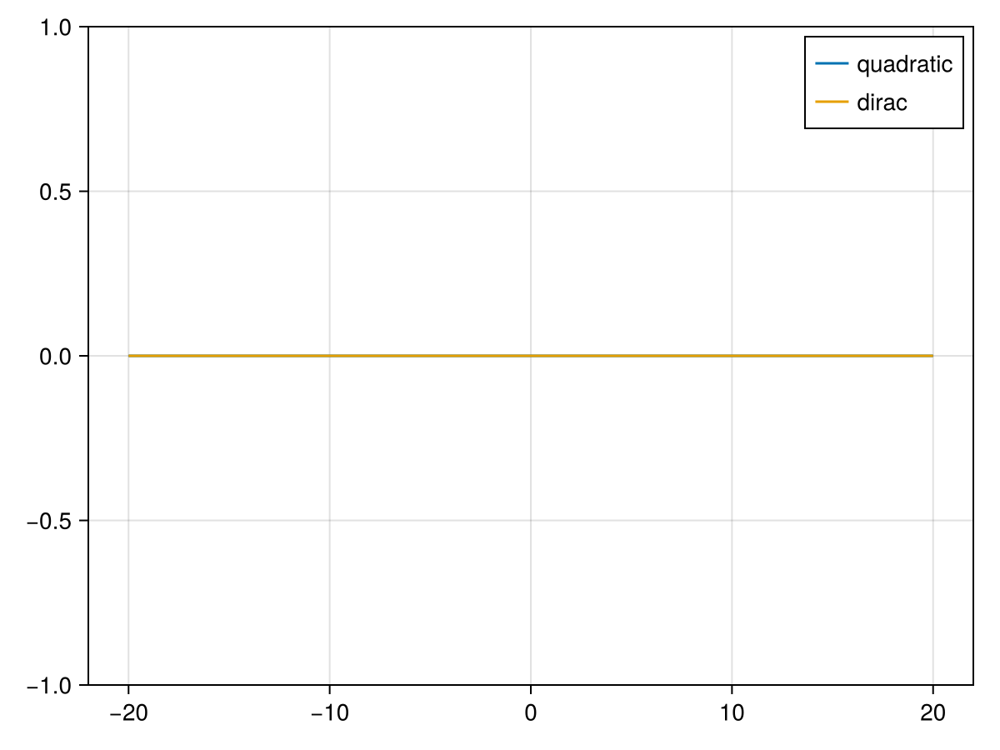

In [31]:
ks = -20:0.1:20
dxcc_quad = getdx_cc(quadsim.liouvillian.hamiltonian)
dxcc_dirac = getdx_cc(diracsim.liouvillian.hamiltonian)
fig,ax,pl = lines(ks,abs.(dxcc_quad.(ks,0)),label="quadratic")
lines!(ax,ks,abs.(dxcc_dirac.(ks,0)),label="dirac")
axislegend(ax)
fig